# Анализ фондового рынка

<b>Описание проекта</b><br>
Из импортированных файлов  с информацией о динамике цен акций на фондовом рынке необходимо собрать датафрейм, осуществить предобработку, добавить метрики и провести исследовательский анализ цены за последние 3 года. В исследовании использовать скользящие средние, экспотенциальные скользящие средние и RSI индикатор.



**Задание**
1. Загрузите информацию об акциях (не менее пяти тикеров) с сайте finam.ru с параметрами:
Интервал: 3 года, периодичность 1 день.
Формат записи в файл:
<TICKER>	<PER>	<DATE>	<TIME>	<OPEN>	<HIGH>	<LOW>	<CLOSE>	<VOL>
https://www.finam.ru/quote/moex/gazp/export/
2. Соберите информацию из файлов в единый датафрейм (используйте дополнительные библиотеки).
3. Осуществите предобработку дат и заголовков.
4. Постройте линейные графики динамики цены для каждой акции (реализуйте в цикле).
5. Для каждой акции найдите дни максимального изменения цены (взлета и падения). Составьте отчет.
6. Найдите скользящие средние (периоды 10, 50, 100) для каждой акции. Добавьте на график.
7. Постройте в цикле графики объема (volume) для каждого тикера.
8. Реализуйте в цикле для каждого тикера последовательно: график цены вместе с скользящими средними с периодом 50, 100 и график объема, реализуйте с помощью функции. На вход функция принимает два параметра: тикер и год.
9. Добавьте экспоненциальные скользящие средние для каждого тикера с периодом 50.
10. Осуществите расчет индикатора RSI.
11.  Создайте функцию для вывода графиков: цены, скользящей средней (тип и период определите самостоятельно) и отдельный график для RSI индикатора. На графике с RSI добавьте две красные линии на уровнях 70 и 30. На вход функция принимает два параметра: тикер и год. <br>

Работу сопроводите комментариями к коду и выводами. 

**Дополнительная задача**<br>
Постройте модель прогноза цены акции

**Дополнительная информация**
1. Экпорт файлов осуществите с сайта:
https://www.finam.ru/quote/moex/gazp/export/
2. Для получения файлов из заданной директории используйте:

import glob<br>
globbed_files = glob.glob(path) # список файлов<br>

3. Информация про индикатор RSI
на БКС Экспресс:<br>
https://bcs-express.ru/novosti-i-analitika/indeks-otnositel-noi-sily-rsi-relative-strength-index<br>
Почитать еще про RSI:<br>
https://ru.tradingview.com/chart/BTCUSD/Eq8tysZA-indikator-rsi-sekrety-torgovli-pravila-primeneniya-polnyj-razbor/

3. Допустима загрузка исторических данных с помощью tinkoff invest api вместо экспорта с finam.ru

# Задание 1. Загрузите информацию об акциях

In [1]:
import glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots


C:\Users\Виктория\AppData\Roaming\Python\Python39\site-packages\matplotlib\projections\__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


In [2]:
sns.set_theme(style='whitegrid', palette='Set2', rc={'figure.figsize':(12, 7)})

In [3]:
globbed_files = glob.glob("*.csv")
globbed_files

['BANE_01122020_01122023.csv',
 'GAZP_01122020_01122023.csv',
 'LKOH_01122020_01122023.csv',
 'ROSN_01122020_01122023.csv',
 'TATN_01122020_01122023.csv']

Для исследования были выбраны 5 акций нефтяных компаний. Временной промежуток: 1 декабря 2020 - 1 декабря 2023.

# Задание 2. Соберите информацию из файлов в единый датафрейм

In [4]:
dfs = []
# цикл: читаем каждый csv-файл и добавляем его в список
for file in globbed_files:
    df = pd.read_csv(file, sep=';')  
    dfs.append(df)
# объединение датафреймов
data = pd.concat(dfs, ignore_index=True)
data

,<TICKER>,<PER>,<DATE>,<TIME>,<OPEN>,<HIGH>,<LOW>,<CLOSE>,<VOL>
0,BANE,D,20201201,0,1698.0,1707.0,1686.0,1691.0,11327
1,BANE,D,20201202,0,1703.0,1707.0,1648.0,1685.5,15541
2,BANE,D,20201203,0,1692.5,1695.5,1678.0,1685.5,4745
3,BANE,D,20201204,0,1690.0,1706.5,1685.0,1685.0,5277
4,BANE,D,20201207,0,1685.0,1707.0,1657.5,1687.0,4132
...,...,...,...,...,...,...,...,...,...
3718,TATN,D,20231127,0,649.1,649.9,636.4,638.4,2292875
3719,TATN,D,20231128,0,638.2,643.7,632.3,641.2,1482882
3720,TATN,D,20231129,0,641.9,644.2,636.6,638.7,932561
3721,TATN,D,20231130,0,639.0,644.0,635.0,638.8,1170553


# Задание 3. Осуществите предобработку дат и заголовков

In [5]:
data.columns=['ticker', 'per', 'date', 'time', 'open', 'high', 'low', 'close', 'vol']

In [6]:
data = data.drop(columns = 'time') #удаляем столбец time, т.к. в нем все значения равны нулю
data

,ticker,per,date,open,high,low,close,vol
0,BANE,D,20201201,1698.0,1707.0,1686.0,1691.0,11327
1,BANE,D,20201202,1703.0,1707.0,1648.0,1685.5,15541
2,BANE,D,20201203,1692.5,1695.5,1678.0,1685.5,4745
3,BANE,D,20201204,1690.0,1706.5,1685.0,1685.0,5277
4,BANE,D,20201207,1685.0,1707.0,1657.5,1687.0,4132
...,...,...,...,...,...,...,...,...
3718,TATN,D,20231127,649.1,649.9,636.4,638.4,2292875
3719,TATN,D,20231128,638.2,643.7,632.3,641.2,1482882
3720,TATN,D,20231129,641.9,644.2,636.6,638.7,932561
3721,TATN,D,20231130,639.0,644.0,635.0,638.8,1170553


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3723 entries, 0 to 3722
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ticker  3723 non-null   object 
 1   per     3723 non-null   object 
 2   date    3723 non-null   int64  
 3   open    3723 non-null   float64
 4   high    3723 non-null   float64
 5   low     3723 non-null   float64
 6   close   3723 non-null   float64
 7   vol     3723 non-null   int64  
dtypes: float64(4), int64(2), object(2)
memory usage: 232.8+ KB


In [8]:
data['date'] = pd.to_datetime(data['date'], format='%Y%m%d')

In [9]:
data['year'] = data['date'].dt.year #добавим столбец, содержащий год
data['year'] = data['year'].astype('str')

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3723 entries, 0 to 3722
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ticker  3723 non-null   object        
 1   per     3723 non-null   object        
 2   date    3723 non-null   datetime64[ns]
 3   open    3723 non-null   float64       
 4   high    3723 non-null   float64       
 5   low     3723 non-null   float64       
 6   close   3723 non-null   float64       
 7   vol     3723 non-null   int64         
 8   year    3723 non-null   object        
dtypes: datetime64[ns](1), float64(4), int64(1), object(3)
memory usage: 261.9+ KB


# Задание 4. Постройте линейные графики динамики цены для каждой акции (реализуйте в цикле)

In [11]:
tickers = list(data['ticker'].unique())
tickers

['BANE', 'GAZP', 'LKOH', 'ROSN', 'TATN']

Построим графики с помощью matplotlib.

<Figure size 1200x1200 with 0 Axes>

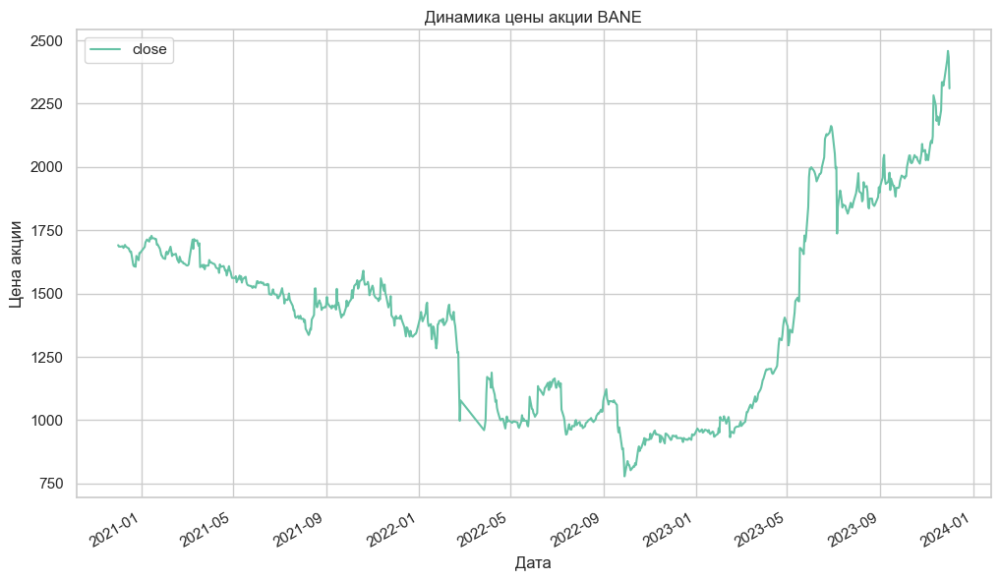

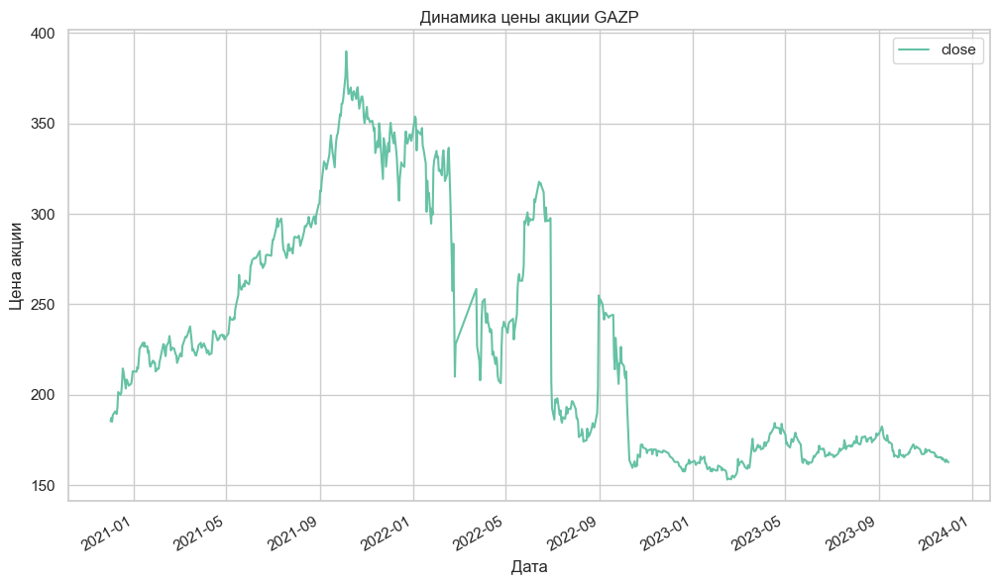

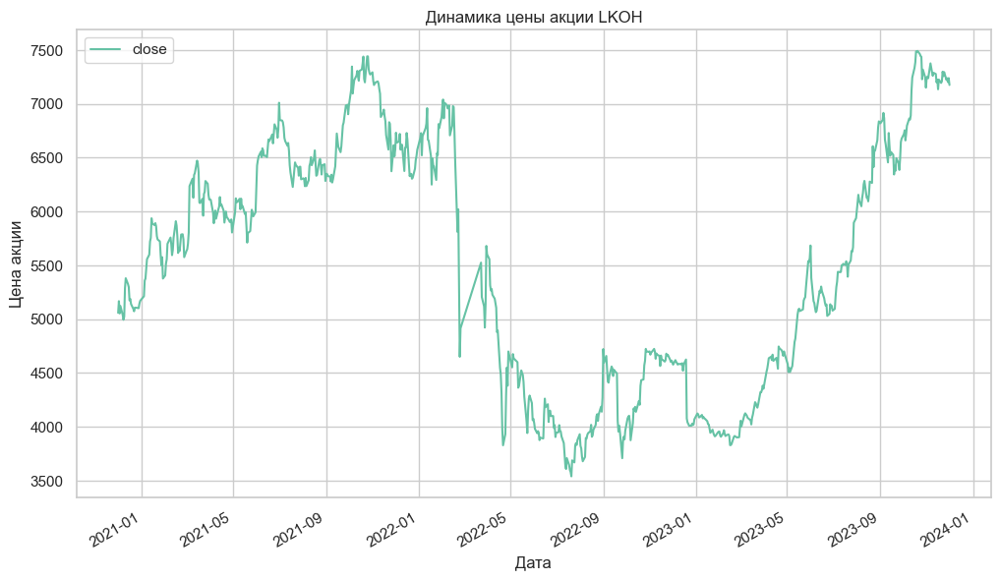

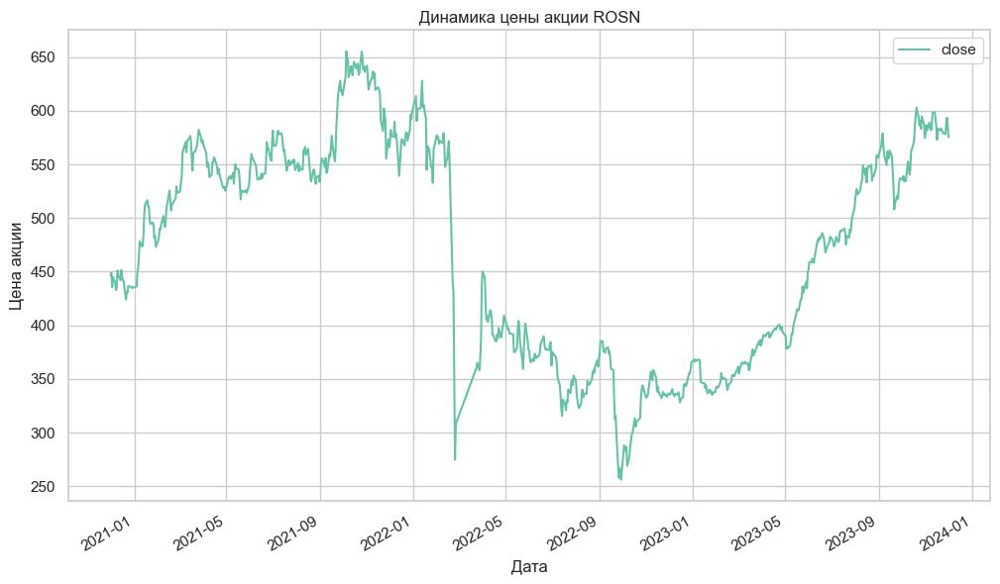

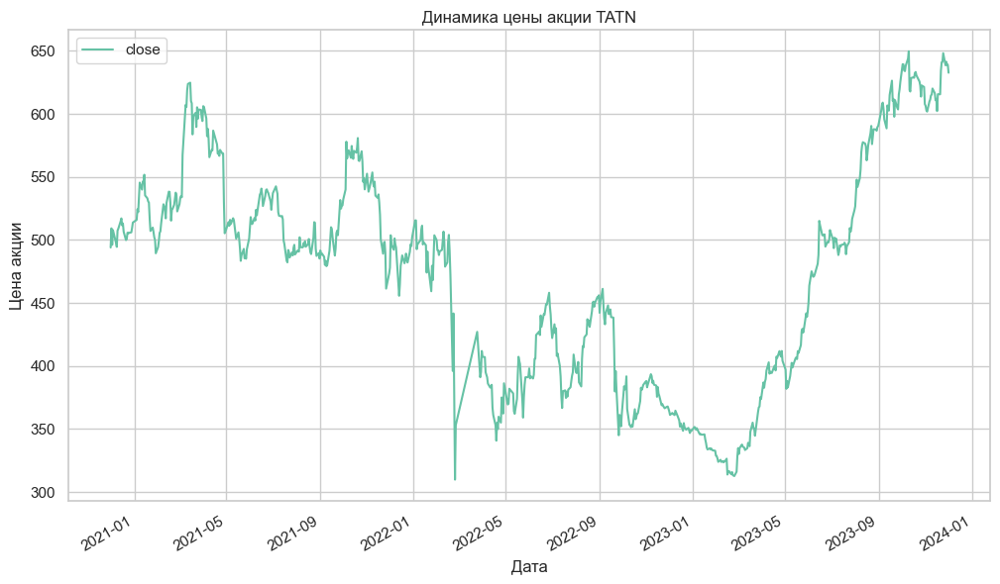

In [12]:
plt.figure(figsize=(12,12))
for t in tickers:
    data_ticker = data[(data['ticker'] == t)]
    data_ticker.plot(kind='line', x='date', y='close')
    plt.xlabel('Дата')
    plt.ylabel('Цена акции')
    plt.title('Динамика цены акции'+" "+t)
    plt.show()

Далее я просто попробовала построить sublot'ы через цикл.

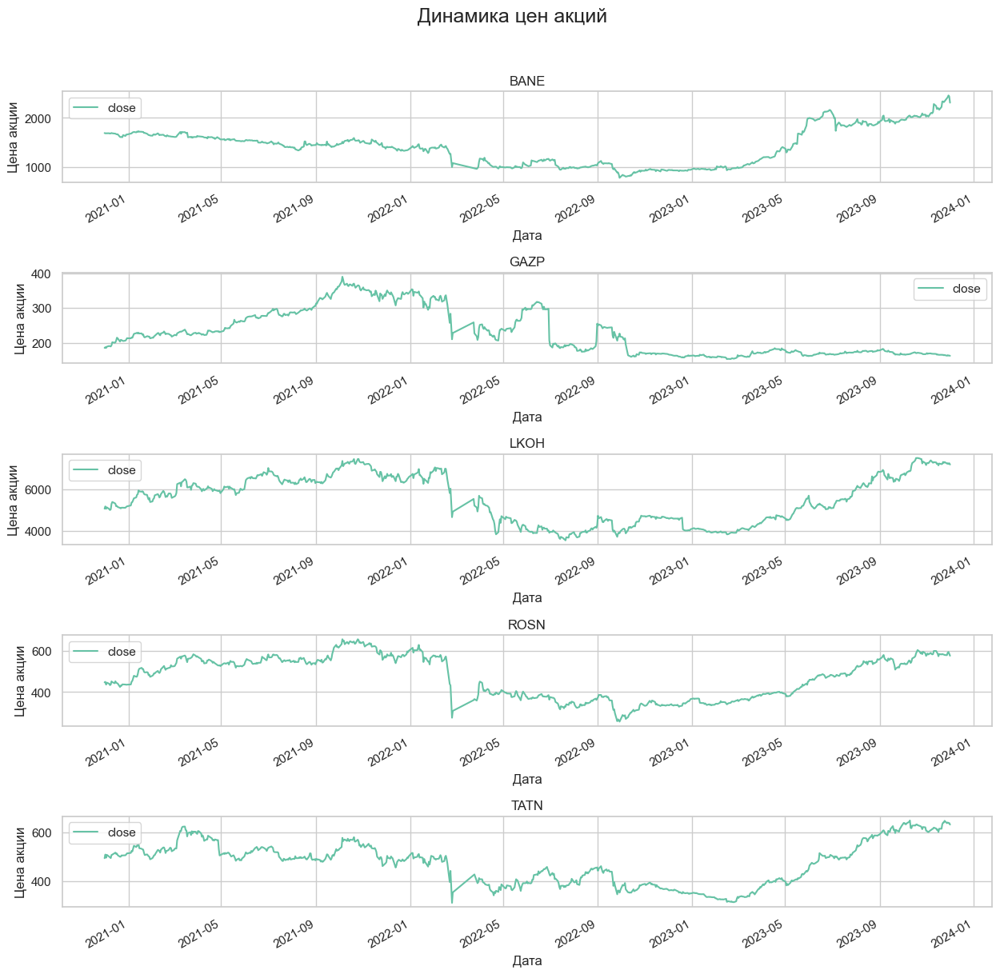

In [13]:
plt.figure(figsize=(15, 15))
plt.subplots_adjust(hspace=1.0)
plt.suptitle("Динамика цен акций", fontsize=18, y=0.95)

for n, ticker in enumerate(tickers):
    ax = plt.subplot(5, 1, n + 1)
    data[(data['ticker'] == ticker)].plot(ax=ax, x='date', y='close')
    ax.set_title(ticker)
    plt.xlabel('Дата')
    plt.ylabel('Цена акции')


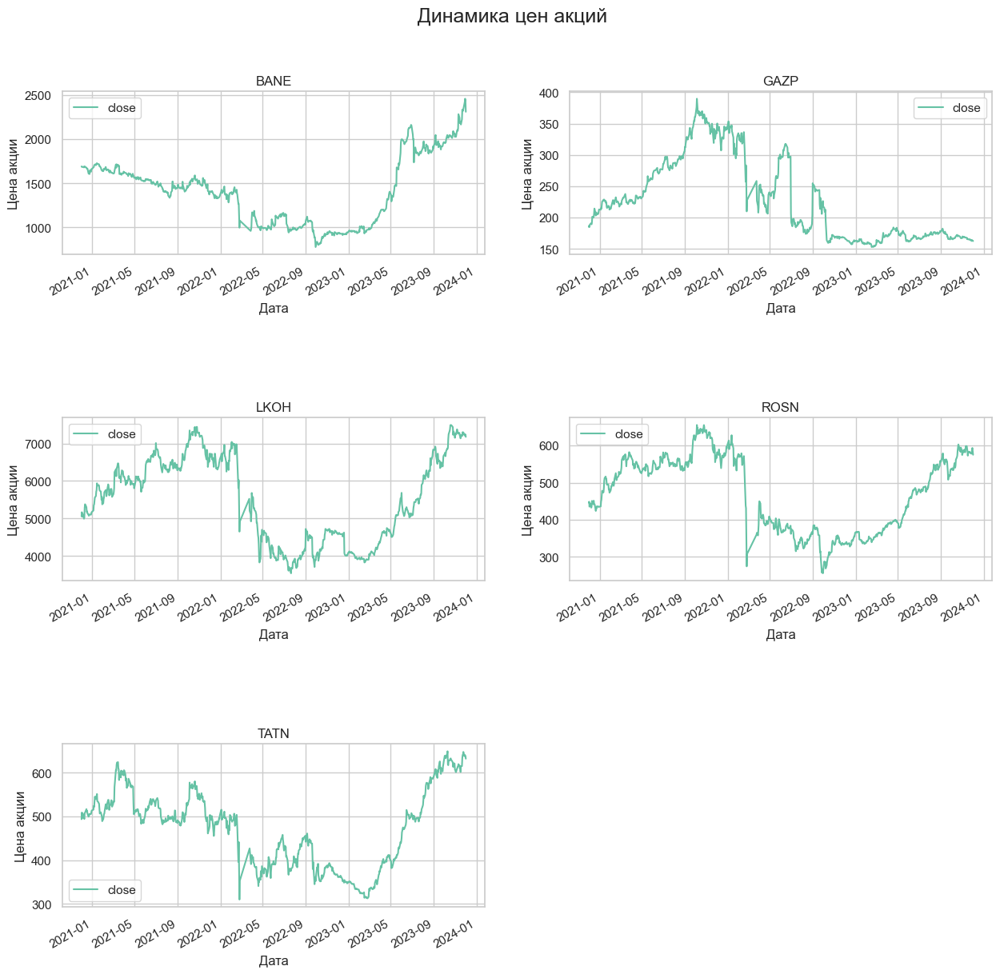

In [14]:
plt.figure(figsize=(15, 15))
plt.subplots_adjust(hspace=1.0)
plt.suptitle("Динамика цен акций", fontsize=18, y=0.95)


for n, ticker in enumerate(tickers):
    ax = plt.subplot(3, 2, n + 1)
    data[(data['ticker'] == ticker)].plot(ax=ax, x='date', y='close')
    ax.set_title(ticker)
    plt.xlabel('Дата')
    plt.ylabel('Цена акции')

Также можно использовать plotly.graph_objects.

In [15]:
for t in tickers:
    data_ticker = data[(data['ticker'] == t)]
    fig = go.Figure(data=go.Scatter(x=data_ticker['date'],y=data_ticker['close'], mode='lines+markers'))
    fig.update_layout(showlegend = False,
                      title_text = t,
                      title_x = 0.5,
                      title_xanchor = 'center')
    fig.show()


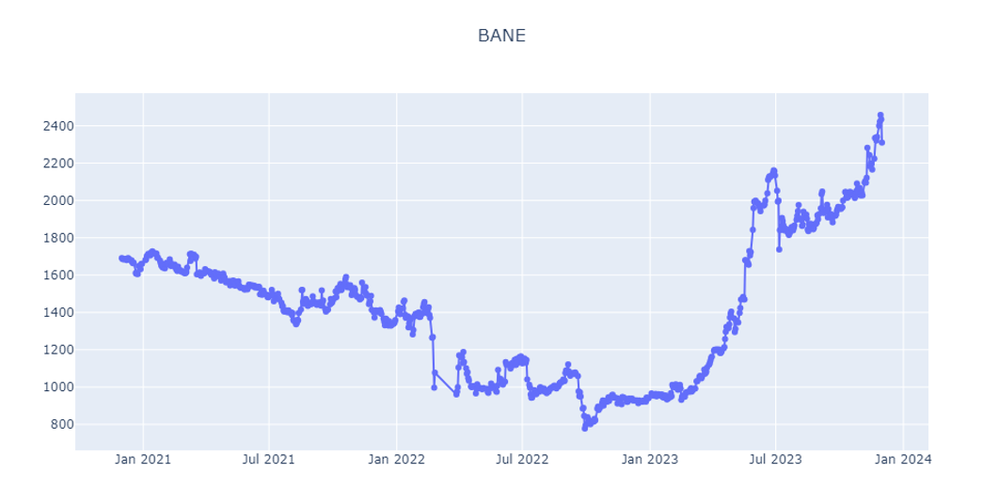


Но если мы захотим построить график, который обычно показан на сайтах банков или бирж, то стоит использовать Candlestick

In [16]:
for t in tickers:
    data_ticker = data[(data['ticker'] == t)]
    fig = go.Figure(data=go.Candlestick(x=data_ticker['date'],
                                        open=data_ticker['open'], 
                                        close=data_ticker['close'], 
                                        high=data_ticker['high'], 
                                        low=data_ticker['low']))
    fig.update_layout(showlegend = False,
                      title_text = t,
                      title_x = 0.5,
                      title_xanchor = 'center')
    fig.show()


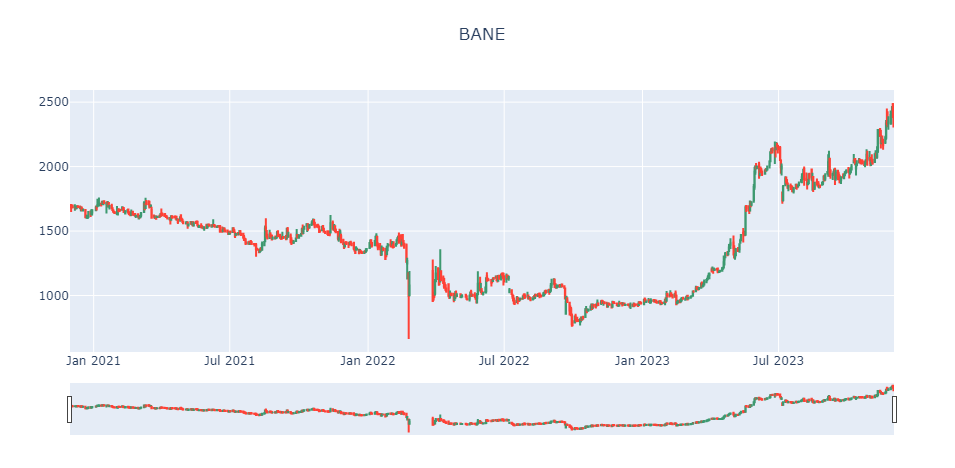


In [17]:
table = pd.pivot_table(data, values=['close'], index=['ticker'], aggfunc="mean")
table

,close
ticker,
BANE,1416.930686
GAZP,227.695128
LKOH,5516.861745
ROSN,470.807315
TATN,473.171409


Мы построили 3 разных варианта графиков динамики цены акций. На мой взгляд, лучшим для анализа динамики является Candlestick, так как на нем проще всего найти периоды падения и подъема цен акций. Также привлекает интерактивность графика.

Наблюдаем падение цен всех акций в конце февраля 2022 года, что было вызвано политическими причинами. Банк России остановил торги акциями на Московской бирже с 28 февраля по 24 марта 2022 года, чем обусловлено появления "разрывов" на графиках. 2022 год стал для компаний непростым: во-первых, снизились объемы экспорта газа в Европу, во-вторых, была введена временная надбавка к НДПИ, позволившая правительтву изъять, например, 1.2 трлн руб у Газпрома.

1. Лукойл<br>
Имеет самую высокую среднюю цену закрытия за период. После падения в ферале 2022 цена акций смогла вернуться к отметке в 7200-7300.
2. Башнефть<br>
Занимает второе место по средней цене закрытия. На фоне прочих выделяется плавной динамикой, почти нет резких изменений. До октября 2022 наблюдаем тенденцию к снижению. Цена акции не только восстановились после февральского падения, но и достигла нового максимума в ноябре 2023: примерно 2400 рублей, что больше февральского уровня на 1400. 
3. Татнефть<br>
По сравнению с другими компаниями, восстановление круса началось позднее - в конце февраля 2023. Продолжение роста цен акции в мае 2023 может быть обусловлено покупкой турецкой топливной компании и сменой курса с добычи нефти на её переработку, что позволило, во-первых, повысить стоимость продукции, а следовательно, и прибыли, во-вторых, найти новый рынок сбыта.
4. Роснефть<br>
Наблюдаем тенденцию к плавному восстановлению, но уровень старого максимума (октябрь 2021) пока не достигнут.
5. Газпром - GAZP <br>
Наблюдаем рост до октября 2021, после чего начинается снижение курса. 30 июня стоимость акций упала на 31% в связи с отказом компании выплачивать дивиденды за 2021 год. С точки зрения акционера, такое решение снижает инвестиционную привлекательность компании. 
В отличие от акций всех предыдущих компаний, акции Газпрома так и не восстановились после февральского кризиса. Их цены колеблятся примерно от 150 до 200 рублей.



# Задание 5. Для каждой акции найдите дни максимального изменения цены (взлета и падения). Составьте отчет.

In [18]:
data['volatility'] = data['close'] - data['open']
data

,ticker,per,date,open,high,low,close,vol,year,volatility
0,BANE,D,2020-12-01,1698.0,1707.0,1686.0,1691.0,11327,2020,-7.0
1,BANE,D,2020-12-02,1703.0,1707.0,1648.0,1685.5,15541,2020,-17.5
2,BANE,D,2020-12-03,1692.5,1695.5,1678.0,1685.5,4745,2020,-7.0
3,BANE,D,2020-12-04,1690.0,1706.5,1685.0,1685.0,5277,2020,-5.0
4,BANE,D,2020-12-07,1685.0,1707.0,1657.5,1687.0,4132,2020,2.0
...,...,...,...,...,...,...,...,...,...,...
3718,TATN,D,2023-11-27,649.1,649.9,636.4,638.4,2292875,2023,-10.7
3719,TATN,D,2023-11-28,638.2,643.7,632.3,641.2,1482882,2023,3.0
3720,TATN,D,2023-11-29,641.9,644.2,636.6,638.7,932561,2023,-3.2
3721,TATN,D,2023-11-30,639.0,644.0,635.0,638.8,1170553,2023,-0.2


In [19]:
report_up = pd.DataFrame()
for i in tickers:
    data_ticker = data[data['ticker'] == i].sort_values(by = 'volatility', ascending=False).head(1)
    data_ticker = data_ticker[['ticker', 'date', 'volatility']]
    report_up = report_up.append(data_ticker,ignore_index=True)
report_up

C:\Users\Виктория\AppData\Local\Temp\ipykernel_15832\4129587875.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Виктория\AppData\Local\Temp\ipykernel_15832\4129587875.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Виктория\AppData\Local\Temp\ipykernel_15832\4129587875.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Виктория\AppData\Local\Temp\ipykernel_15832\4129587875.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Виктория\AppData\Local\Temp\ipykernel_15832\4129587875.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use

,ticker,date,volatility
0,BANE,2023-05-18,209.50
1,GAZP,2022-02-22,29.56
2,LKOH,2022-03-31,568.00
3,ROSN,2022-03-24,48.10
4,TATN,2022-02-25,45.00


In [20]:
report_down = pd.DataFrame()
for i in tickers:
    data_ticker = data[data['ticker'] == i].sort_values(by = 'volatility', ascending=True).head(1)
    data_ticker = data_ticker[['ticker', 'date', 'volatility']]
    report_down = report_down.append(data_ticker,ignore_index=True)
report_down

C:\Users\Виктория\AppData\Local\Temp\ipykernel_15832\1706531797.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Виктория\AppData\Local\Temp\ipykernel_15832\1706531797.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Виктория\AppData\Local\Temp\ipykernel_15832\1706531797.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Виктория\AppData\Local\Temp\ipykernel_15832\1706531797.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Виктория\AppData\Local\Temp\ipykernel_15832\1706531797.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use

,ticker,date,volatility
0,BANE,2022-03-28,-230.50
1,GAZP,2022-06-30,-92.60
2,LKOH,2022-02-24,-750.00
3,ROSN,2022-02-24,-113.65
4,TATN,2022-02-24,-90.10


In [21]:
report = report_down.merge(report_up, on='ticker', how='right')
report.columns = ['ticker', 'date_down', 'volatility_down', 'date_up', 'volatility_up']
report['date_down'] = report['date_down'].astype(str)
report['date_up'] = report['date_up'].astype(str)
report

,ticker,date_down,volatility_down,date_up,volatility_up
0,BANE,2022-03-28,-230.50,2023-05-18,209.50
1,GAZP,2022-06-30,-92.60,2022-02-22,29.56
2,LKOH,2022-02-24,-750.00,2022-03-31,568.00
3,ROSN,2022-02-24,-113.65,2022-03-24,48.10
4,TATN,2022-02-24,-90.10,2022-02-25,45.00


In [22]:
for i in range(0,5):
    print(f'Для акции {report.loc[i]["ticker"]} день максимального взлета цены - {report.loc[i]["date_up"]}, падения цены - {report.loc[i]["date_down"]}')
    

Для акции BANE день максимального взлета цены - 2023-05-18, падения цены - 2022-03-28
Для акции GAZP день максимального взлета цены - 2022-02-22, падения цены - 2022-06-30
Для акции LKOH день максимального взлета цены - 2022-03-31, падения цены - 2022-02-24
Для акции ROSN день максимального взлета цены - 2022-03-24, падения цены - 2022-02-24
Для акции TATN день максимального взлета цены - 2022-02-25, падения цены - 2022-02-24


Как и ожидалось, для большинства акций максимальное падение цены пришлось на 24.02.2022, т.е. начало политического кризиса. Однако для Газпрома максимальное падение произошло 30.06.2022, когда компания отказалась выплачивать дивиденды.

Дни максимального взлета цен акций:

22.02.2022: спотовые цены на нефть и газ 22 февраля перешли к стремительному росту на фоне обострения геополитической ситуации. 

25.02.2022: российский фондовый рынок восстанавливался от потерь 24 февраля.

24.03.2022: торги акциями на Мосбирже возобновились после длительного перерыва — их приостановили 28 февраля. К торгам были допущены 33 бумаги из индекса Мосбиржи, в том числе акции «Газпрома», «Аэрофлота», ЛУКОЙЛа, «Роснефти». 

31.03.2022: в этот день Мосбиржа увеличила время торгов акциями российских эмитентов и иностранными ценными бумагами. До этого несколько дней, которым предшествовала месячная приостановка.





In [23]:
data['volatility_percentage'] = round((data['close'] - data['open']) / data['open'] * 100, 2)
report_up = pd.DataFrame()
for i in tickers:
    data_ticker = data[data['ticker'] == i].sort_values(by = 'volatility_percentage', ascending=False).head(1)
    data_ticker = data_ticker[['ticker', 'date', 'volatility_percentage']]
    report_up = report_up.append(data_ticker,ignore_index=True)
report_up
report_down = pd.DataFrame()
for i in tickers:
    data_ticker = data[data['ticker'] == i].sort_values(by = 'volatility_percentage', ascending=True).head(1)
    data_ticker = data_ticker[['ticker', 'date', 'volatility_percentage']]
    report_down = report_down.append(data_ticker,ignore_index=True)
report_down
report = report_down.merge(report_up, on='ticker', how='right')
report.columns = ['ticker', 'date_down', 'volatility_percentage_down', 'date_up', 'volatility_percentage_up']
report['date_down'] = report['date_down'].astype(str)
report['date_up'] = report['date_up'].astype(str)
report

C:\Users\Виктория\AppData\Local\Temp\ipykernel_15832\3998389770.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Виктория\AppData\Local\Temp\ipykernel_15832\3998389770.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Виктория\AppData\Local\Temp\ipykernel_15832\3998389770.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Виктория\AppData\Local\Temp\ipykernel_15832\3998389770.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Виктория\AppData\Local\Temp\ipykernel_15832\3998389770.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use

,ticker,date_down,volatility_percentage_down,date_up,volatility_percentage_up
0,BANE,2022-03-28,-19.36,2023-05-18,14.25
1,GAZP,2022-06-30,-30.91,2022-02-22,11.64
2,LKOH,2022-02-24,-13.89,2022-02-25,11.70
3,ROSN,2022-02-24,-29.26,2022-03-24,15.41
4,TATN,2022-02-24,-22.53,2022-02-25,14.61


Данный отчет соотвествует предыдущему.Исключение - для акции LKOH день максимального роста цены в относительных величинах- 2022-02-25. Как мы уже сказали, в этот день рынок восстанавливался.

# Задание 6. Найдите скользящие средние (периоды 10, 50, 100) для каждой акции. Добавьте на график

In [24]:
sma_10_list = []
sma_50_list = []
sma_100_list = []
sma_10 = []
sma_50 = []
sma_100 = []
for i in tickers:
    sma_10_ticker = data[data['ticker'] == i]['close'].rolling(window=10).mean()
    sma_50_ticker = data[data['ticker'] == i]['close'].rolling(window=50).mean()
    sma_100_ticker = data[data['ticker'] == i]['close'].rolling(window=100).mean()
    sma_10_list.append(sma_10_ticker) #список, длина = 5!
    sma_50_list.append(sma_50_ticker)
    sma_100_list.append(sma_100_ticker)
for i in range(len(sma_10_list)):
    sma_10 += list(sma_10_list[i])
    sma_50 += list(sma_50_list[i])
    sma_100 += list(sma_100_list[i])
data['SMA_10'] = sma_10
data['SMA_50'] = sma_50 
data['SMA_100'] = sma_100
data

,ticker,per,date,open,high,low,close,vol,year,volatility,volatility_percentage,SMA_10,SMA_50,SMA_100
0,BANE,D,2020-12-01,1698.0,1707.0,1686.0,1691.0,11327,2020,-7.0,-0.41,NaN,NaN,NaN
1,BANE,D,2020-12-02,1703.0,1707.0,1648.0,1685.5,15541,2020,-17.5,-1.03,NaN,NaN,NaN
2,BANE,D,2020-12-03,1692.5,1695.5,1678.0,1685.5,4745,2020,-7.0,-0.41,NaN,NaN,NaN
3,BANE,D,2020-12-04,1690.0,1706.5,1685.0,1685.0,5277,2020,-5.0,-0.30,NaN,NaN,NaN
4,BANE,D,2020-12-07,1685.0,1707.0,1657.5,1687.0,4132,2020,2.0,0.12,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3718,TATN,D,2023-11-27,649.1,649.9,636.4,638.4,2292875,2023,-10.7,-1.65,625.80,621.774,589.666
3719,TATN,D,2023-11-28,638.2,643.7,632.3,641.2,1482882,2023,3.0,0.47,628.85,622.396,591.171
3720,TATN,D,2023-11-29,641.9,644.2,636.6,638.7,932561,2023,-3.2,-0.50,631.54,622.934,592.602
3721,TATN,D,2023-11-30,639.0,644.0,635.0,638.8,1170553,2023,-0.2,-0.03,635.21,623.758,594.043


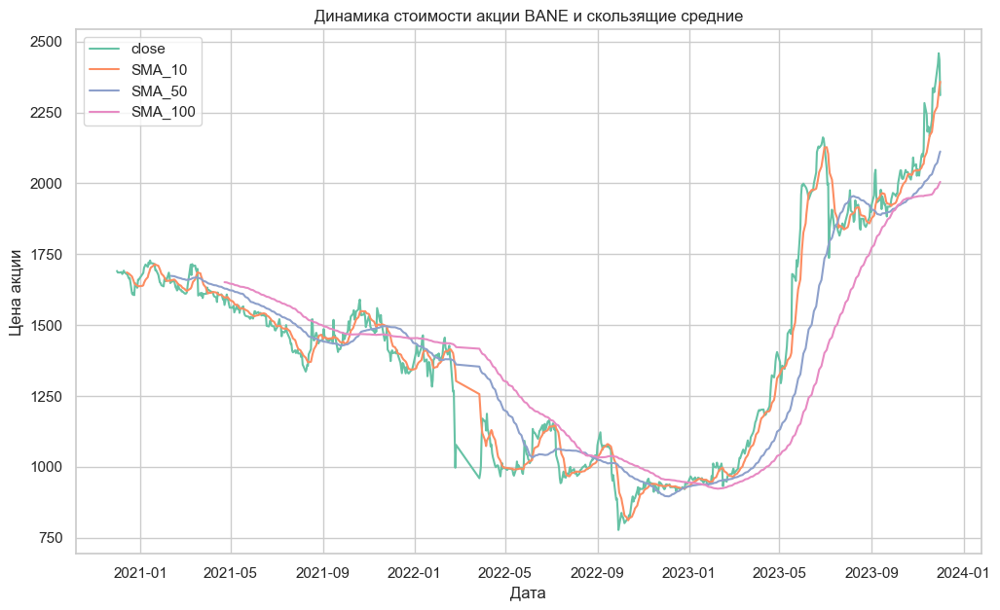

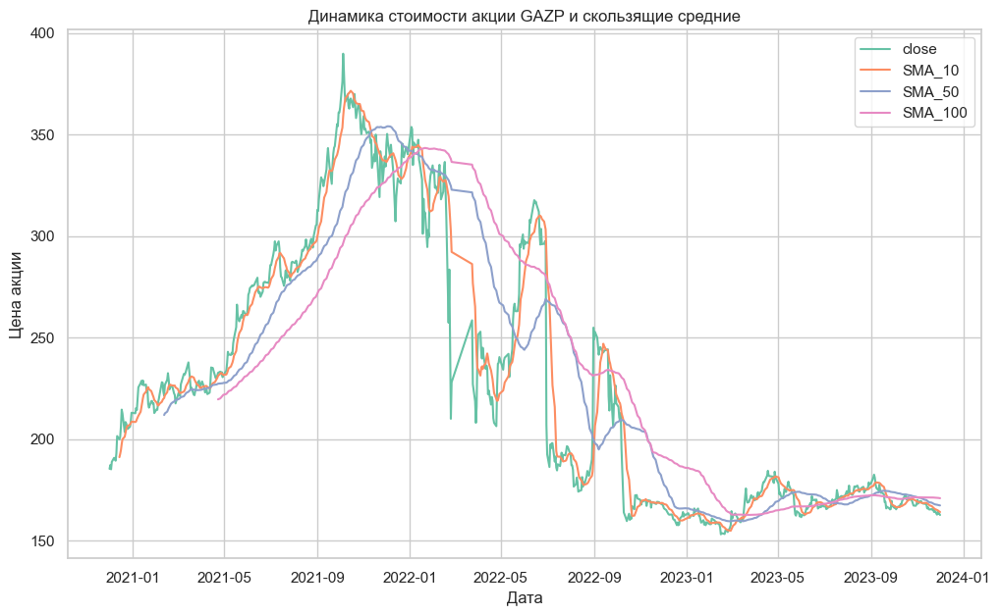

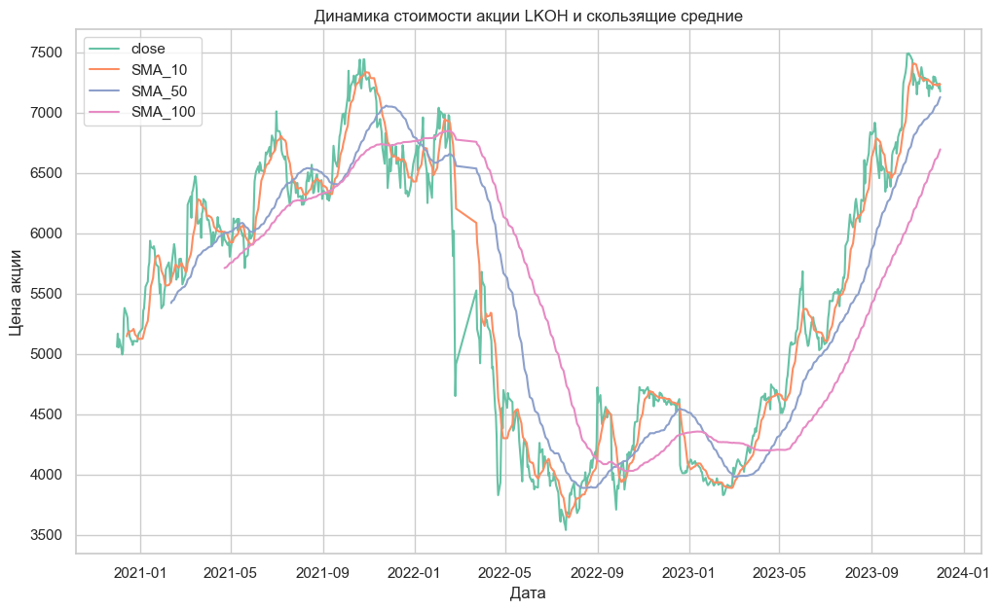

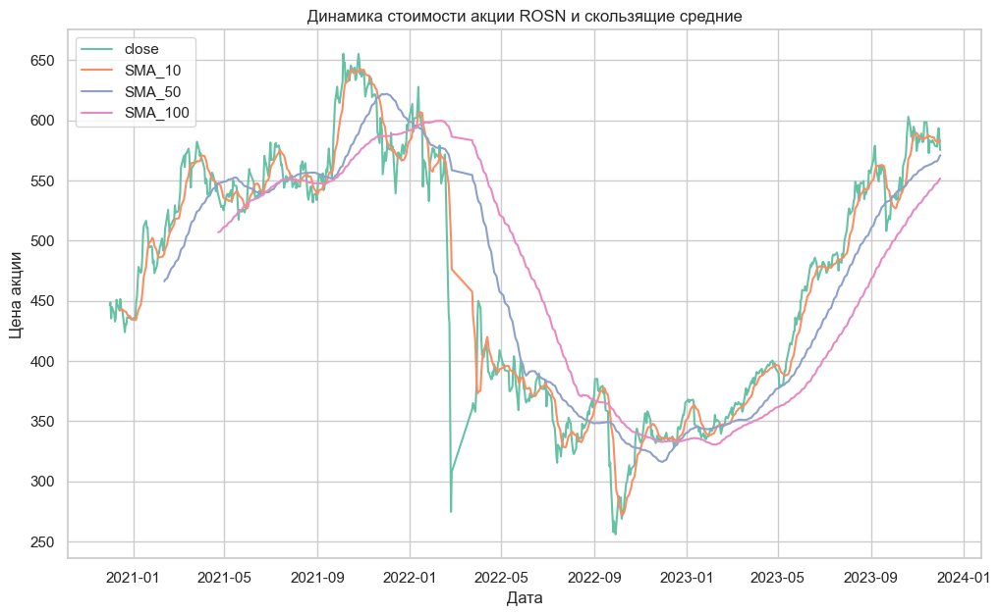

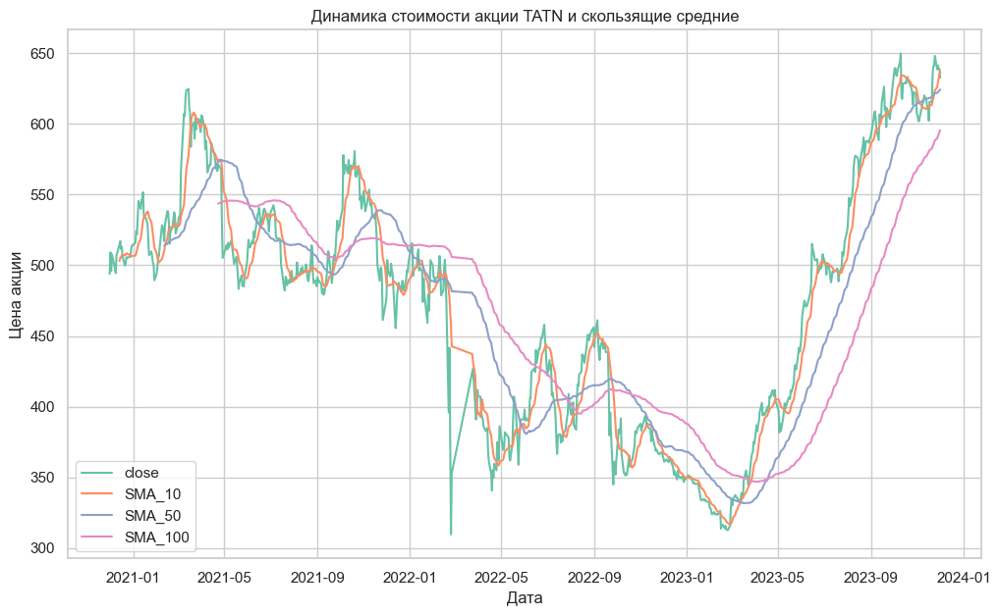

In [25]:
for i in tickers:
    data_ticker= data[data['ticker'] == i]
    sns.lineplot(data=data_ticker, x='date', y='close').set(title=f'Динамика стоимости акции {i} и скользящие средние',  xlabel='Дата', ylabel='Цена акции')
    sns.lineplot(data=data_ticker, x='date', y='SMA_10')
    sns.lineplot(data=data_ticker, x='date', y='SMA_50')
    sns.lineplot(data=data_ticker, x='date', y='SMA_100')
    plt.legend(['close', 'SMA_10', 'SMA_50', 'SMA_100'])
    plt.show()


Очевидно, чем больше период для расчета средней скользящий, тем более сглажен график скользящей и тем меньше он похож на исходный график. <br>
Если нужно рассмотреть ситуацию за большой промежуток времени, не обращая внимания на небольшие колебания, то подойдут SMA_50 и SMA_100. Но в нашей ситуации стоит остановиться на SMA_10, так как у него не так ярко выражено "запаздывание", и колебания все ещё заметны.


# Задание 7. Постройте в цикле графики объема (volume) для каждого тикера.

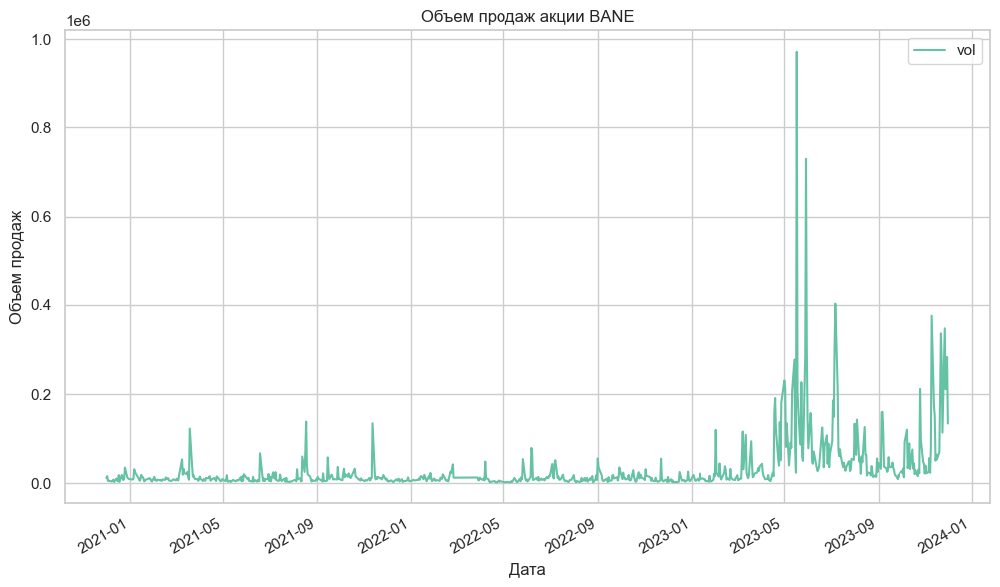

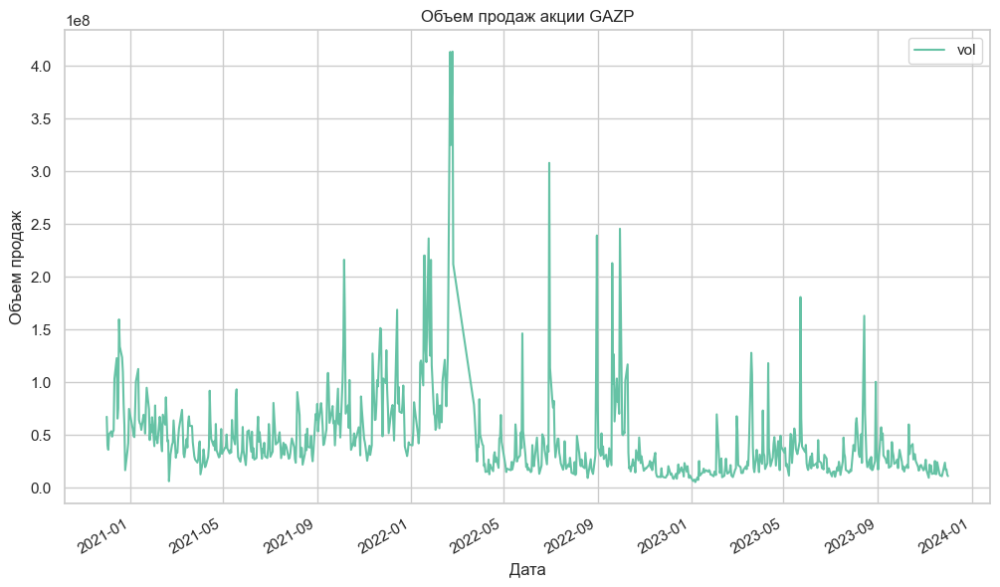

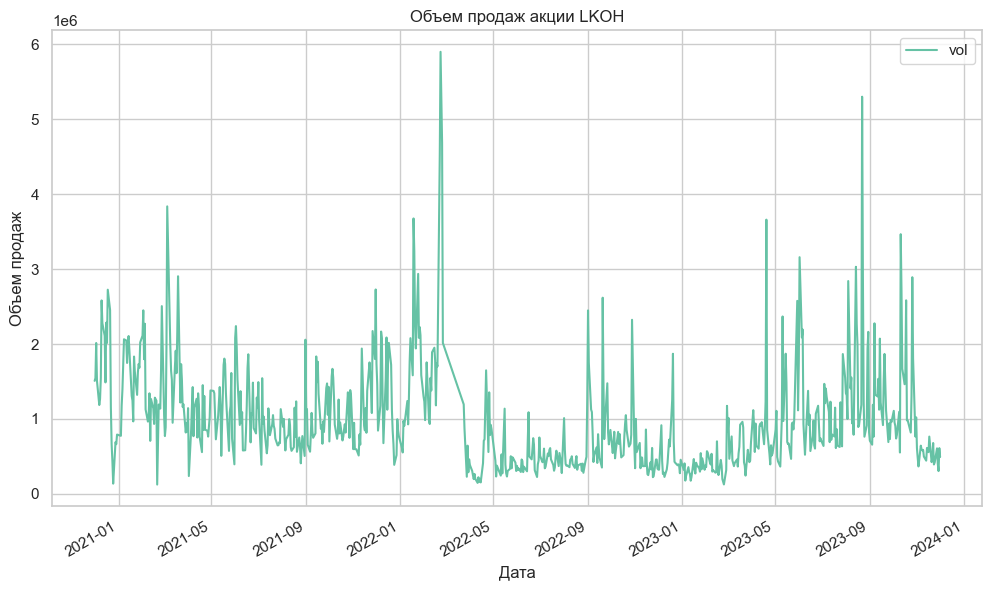

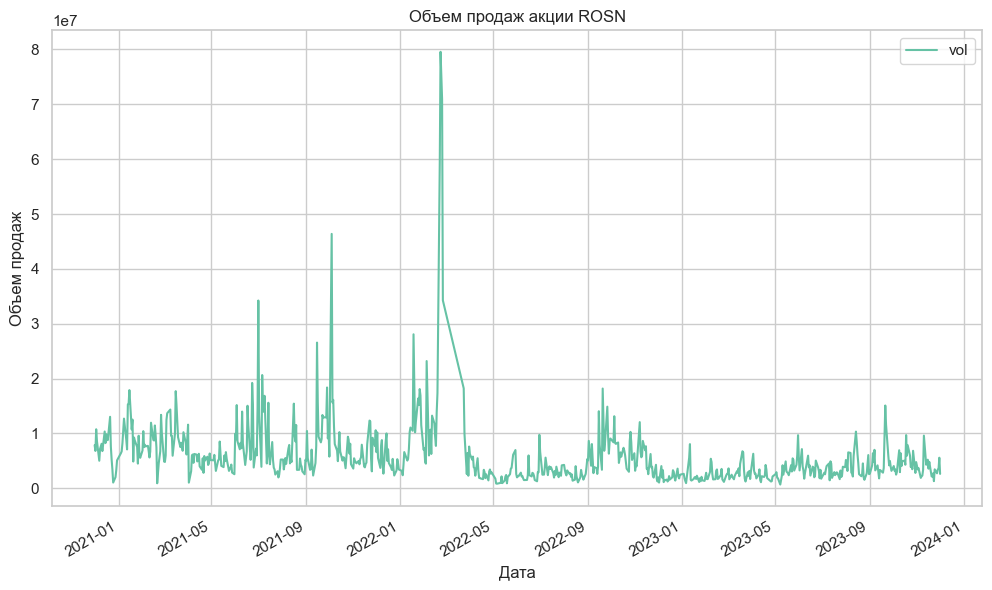

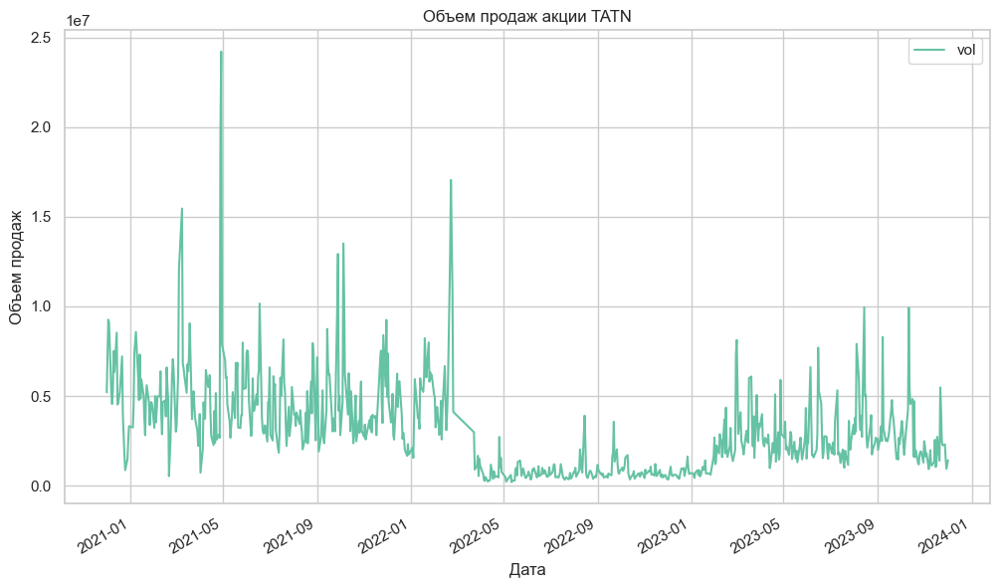

In [26]:
for t in tickers:
    data_ticker = data[(data['ticker'] == t)]
    data_ticker.plot(kind='line', x='date', y='vol')
    plt.xlabel('Дата')
    plt.ylabel('Объем продаж')
    plt.title('Объем продаж акции'+" "+t)

КОММЕНТАРИИ


Построим графики объема с помощью библиотеки plotly.graph_objects.

In [27]:
for t in tickers:
    data_ticker = data[(data['ticker'] == t)]
    fig = go.Figure(data=go.Bar(x=data_ticker['date'],y=data_ticker['vol']))
    fig.update_layout(showlegend = False,
                      title_text = f'Объем продаж акции {t}',
                      title_x = 0.5,
                      title_xanchor = 'center')
    fig.show()

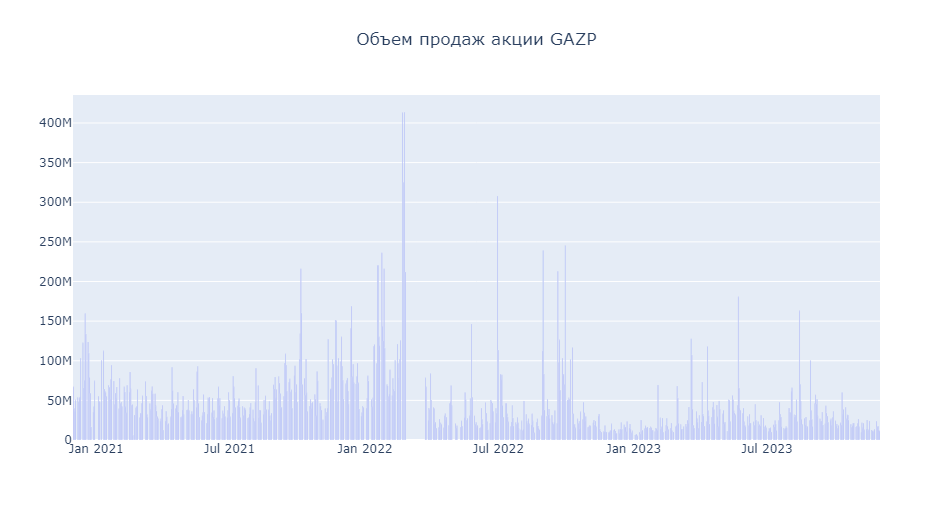

При изучении фондового рынка (а если точнее, поедения инвесторов) стоит объединить два графика - цены акции и объема продаж.

In [28]:
for t in tickers:
    data_ticker = data[(data['ticker'] == t)]
    fig2 = make_subplots(specs=[[{"secondary_y": True}]])
    fig2.add_trace(go.Scatter(x=data_ticker['date'],y=data_ticker['close'], name='Price', mode='lines+markers'),secondary_y=False)
    fig2.add_trace(go.Bar(x=data_ticker['date'],y=data_ticker['vol'],name='Volume'),secondary_y=True)
    fig2.update_layout(showlegend = False,
                      title_text = t,
                      title_x = 0.5,
                      title_xanchor = 'center')
    fig2.show()

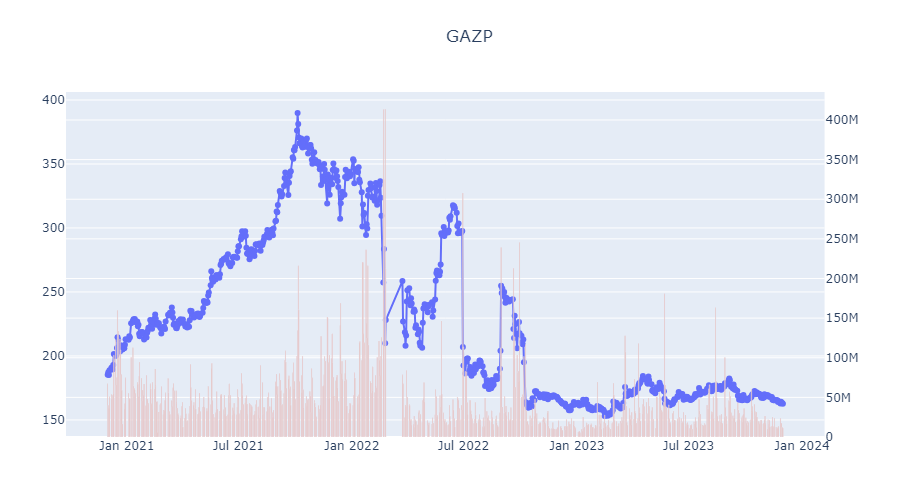

Как мы писали выше, в феврале 2022 года на рынке был обвал. Так как цены значительно снизились, было выгодно купить акции.
Действительно, в этот период выросло число сделок по акциям Газпрома, Лукойла, Роснефти, Татнефти. Для Башнефти объем продаж был невысоким, так как цена изменился не так сильно, по сравнению с другими акциями.

В целом, акции чаще покупают в период падения цен.

# Задание 8. Реализуйте в цикле для каждого тикера последовательно: график цены вместе с скользящими средними с периодом 50, 100 и график объема, реализуйте с помощью функции. На вход функция принимает два параметра: тикер и год

In [29]:
def plot_function_1(tickers, years):
    for ticker in tickers: 
        for year in years:
            df = data[(data['ticker'] == ticker) & (data['year'] == year)]
            #построение графиков
            sns.lineplot(data=df, x='date', y='close').set(title=f'Динамика стоимости акции {ticker} и скользящие средние за {year} год',  xlabel='Дата', ylabel='Цена акции')
            sns.lineplot(data=df, x='date', y='SMA_50')
            sns.lineplot(data=df, x='date', y='SMA_100')
            plt.legend(['close', 'SMA_50', 'SMA_100'])
            plt.show()
            sns.lineplot(data=df, x='date', y='vol').set(title=f'Объем продаж акции {ticker} и скользящие средние за {year} год',  xlabel='Дата', ylabel='Объем продаж')
            plt.legend(['vol'])
            plt.show()


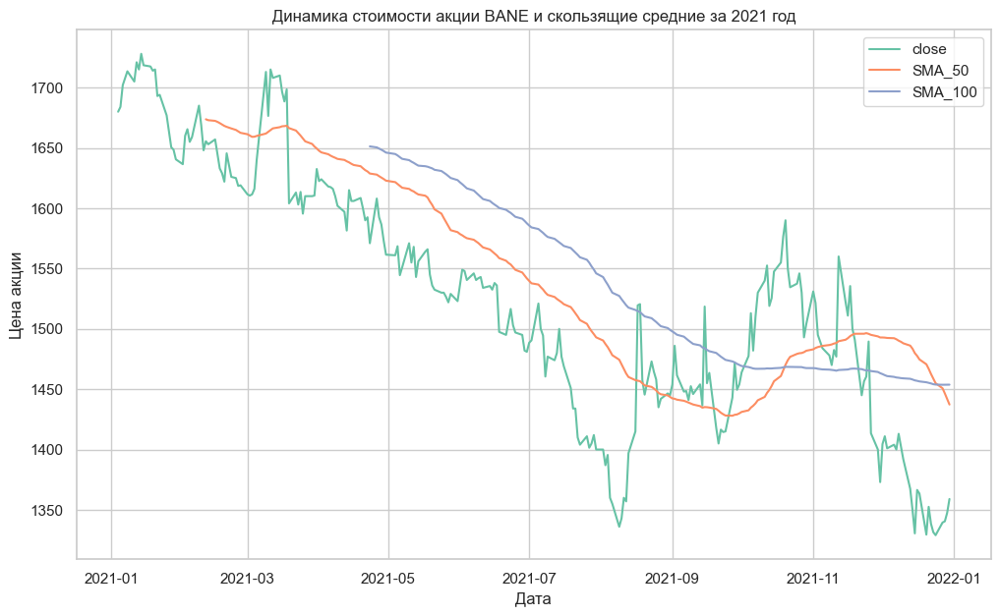

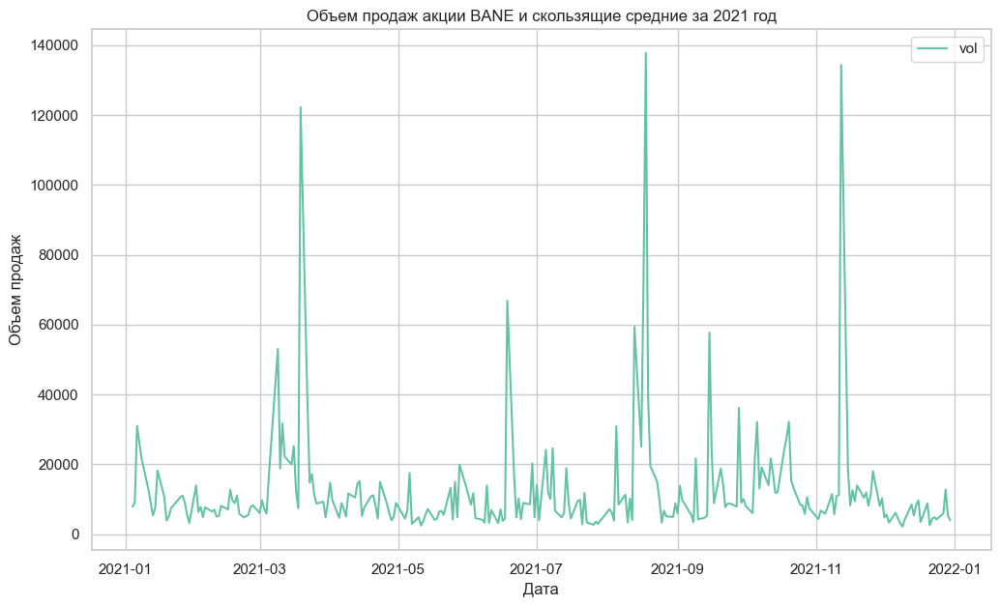

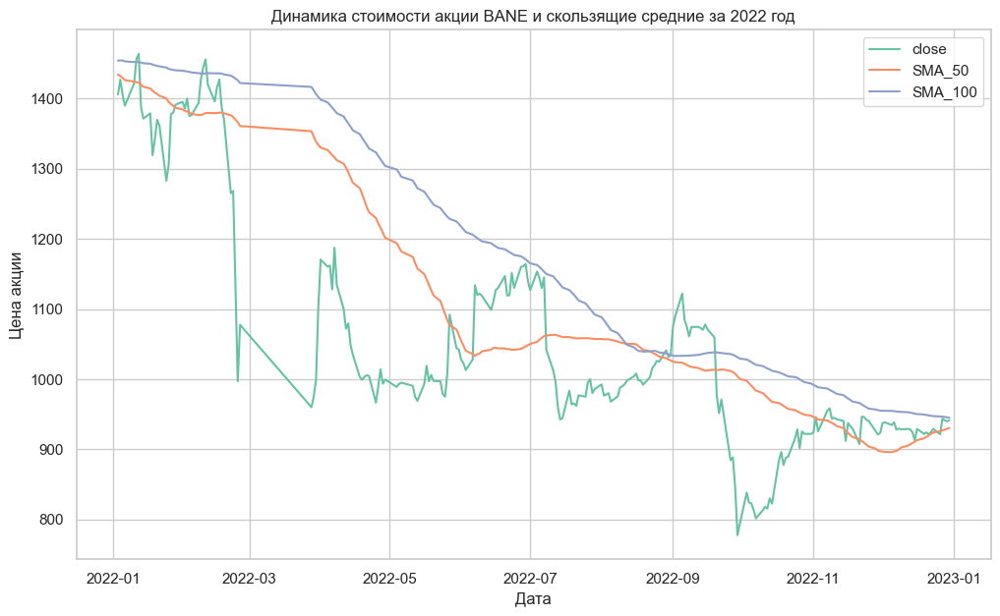

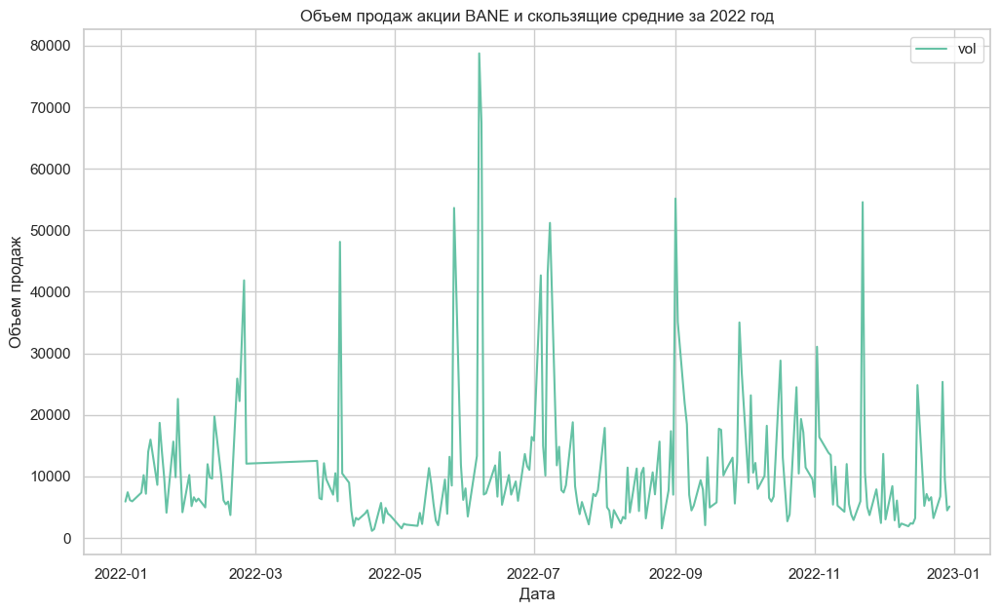

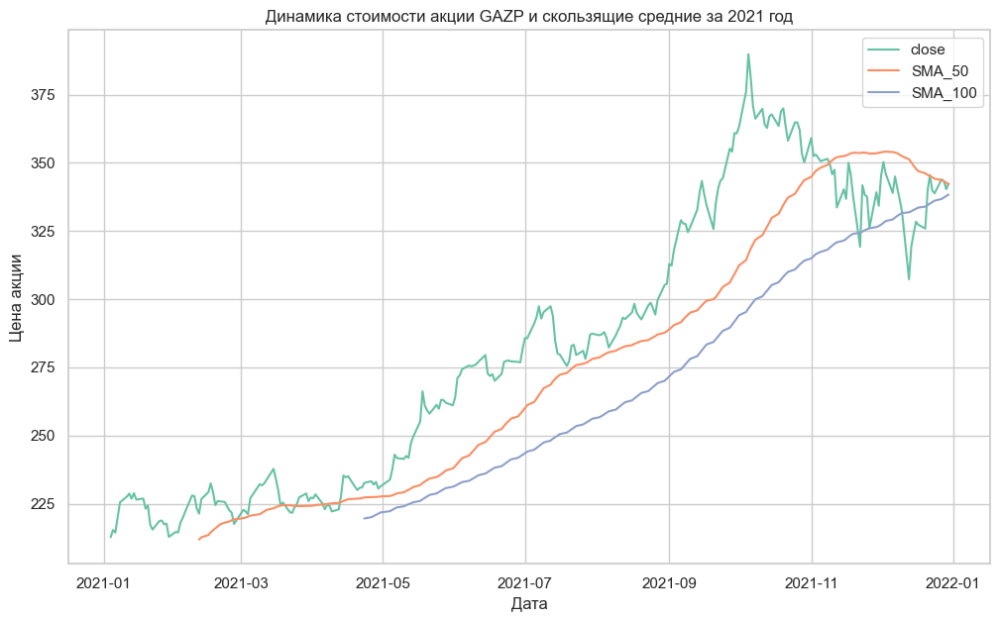

...

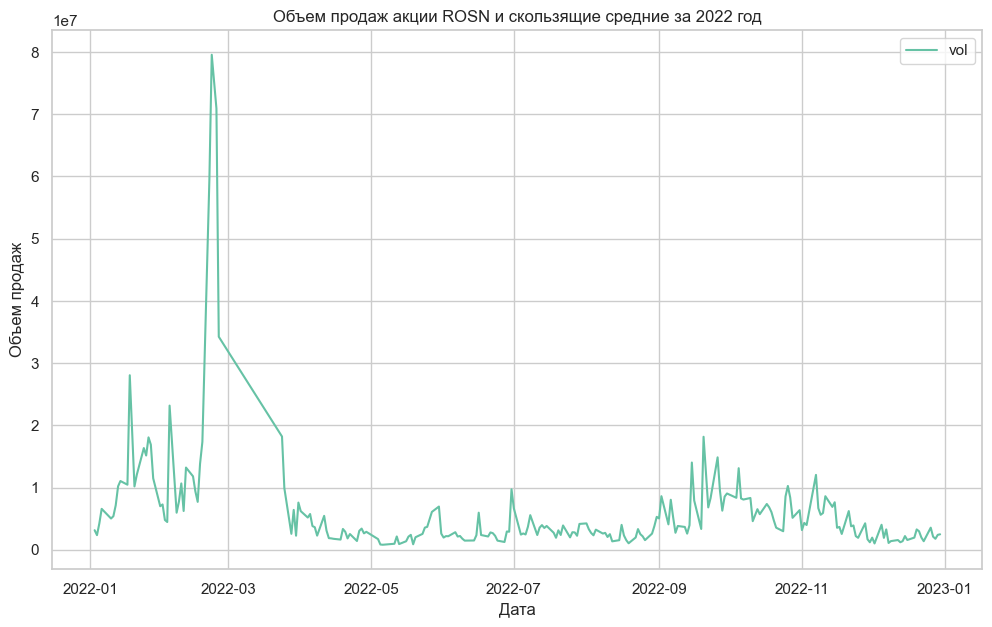

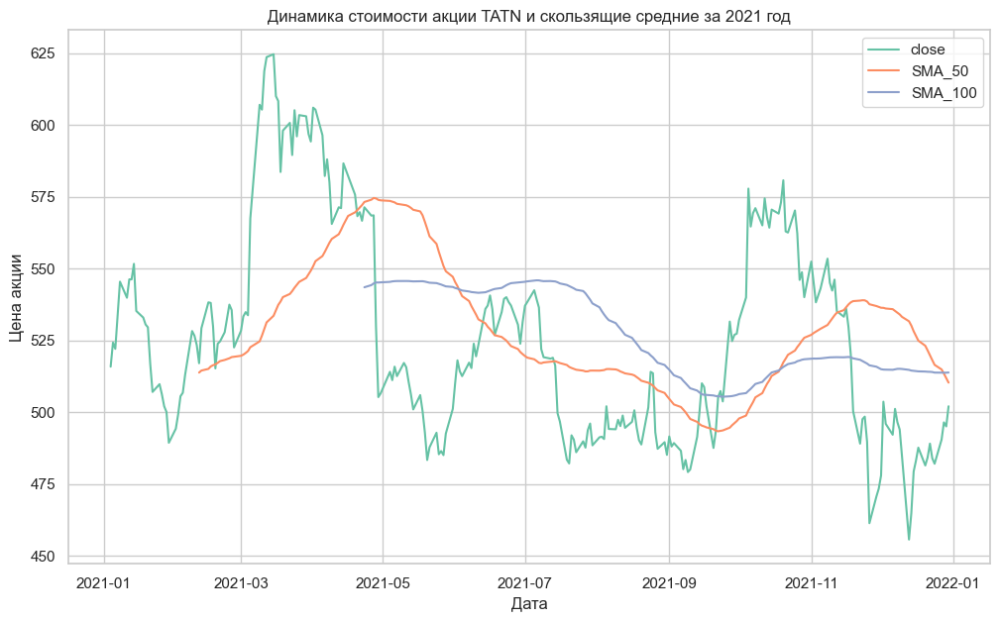

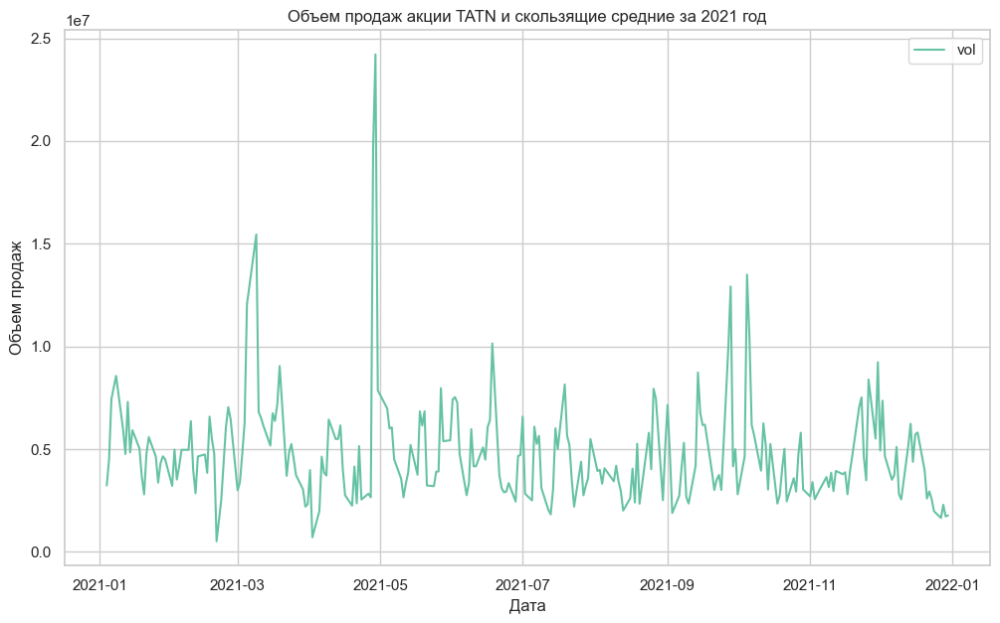

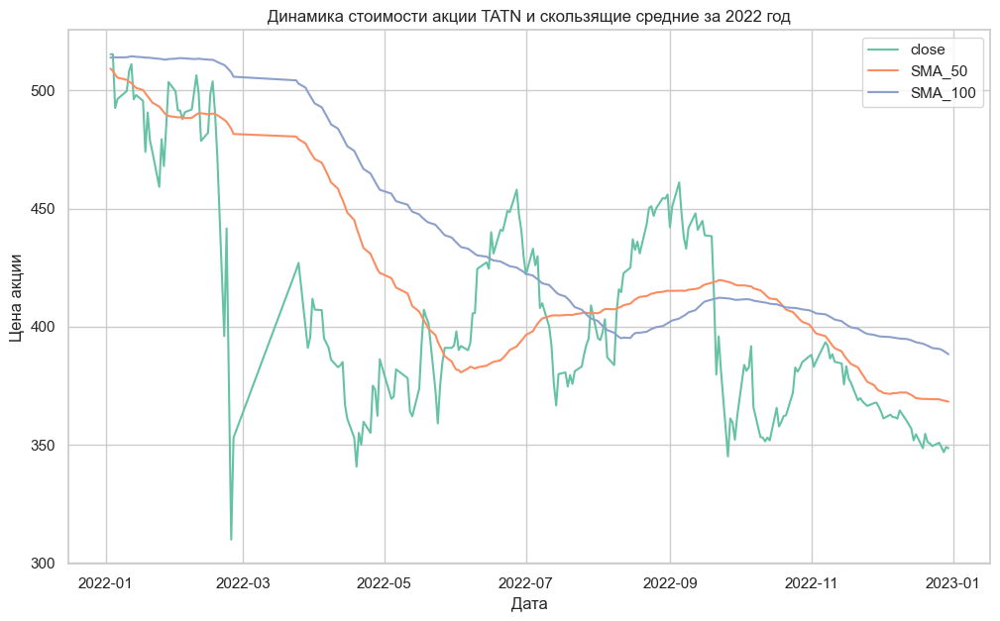

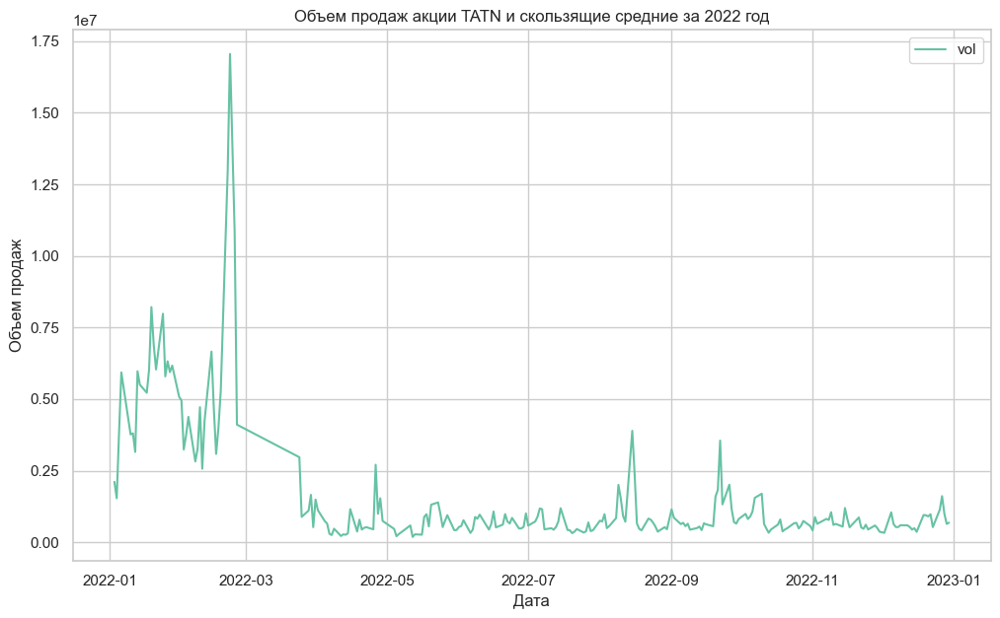

In [30]:
years_8 = ['2021', '2022'] 
tickers_8 = ['TATN', 'ROSN'] #возьмем часть данных, чтобы не было много графиков
plot_function_1(tickers, years_8)

При пересечении двух простых скользящих средних - краткосрочной (50 дней) и долгосрочной (100-200 дней) формируется крест:
1. Мертвый или крест смерти: SMA_50 сверху-вниз пересекает SMA_100 (медвежий сигнал).
   
Первая стадия Креста смерти обычно характеризуется тем, что актив находится в восходящем тренде. За ней следует ослабление 50-дневной MA - первый признак того, что на горизонте может появиться медвежий тренд. По мере того как цены начинают падать после пика, краткосрочная SMА расходится с долгосрочной. На втором этапе 50-дневная SМА пересекает вниз 100-дневную SМА. Это ключевой момент, поскольку он сигнализирует о возможном вхождении актива в нисходящий тренд. Расхождение между двумя SМА становится все более выраженным по мере дальнейшего падения цен. Последняя стадия характеризуется тем, что 50-дневная SМА продолжает нисходящий тренд, оставаясь ниже 100-дневной SМА. Это сигнализирует о том, что нисходящий тренд действительно начался. Крест смерти, обычно, приводит к дальнейшему давлению продаж, поскольку трейдеры ликвидируют свои позиции в ожидании дальнейшего снижения цен. Однако, если нисходящий тренд не закрепился, это может означать кратковременность импульса и быстрый отскок цен, и в этом случае Крест смерти будет считаться ложным сигналом.
   
2. Золотой: SMA_50 снизу-вверх пересекает SMA_100 (бычий сигнал). 

Золотое пересечение свидетельствует о росте цен и развороте рынка вверх. Формация "Золотой крест" обычно состоит из трех этапов. Когда продажи иссякают, это обычно означает конец нисходящего тренда и, следовательно, начало Золотого креста. Следующий этап наступает, когда краткосрочная SMA_50 пересекает SMA_100. За этим быстро следует последняя стадия, характеризующаяся продолжением восходящего тренда, обычно ведущего к росту цен.

В целом золотой и крест смерти можно использовать в качестве сигналов разворота тренда. Если трейдер видит, что формируется Золотой крест, он может купить актив в ожидании роста цен. Аналогично, если трейдер видит формирование Креста смерти, он может продать актив в ожидании падения цен.


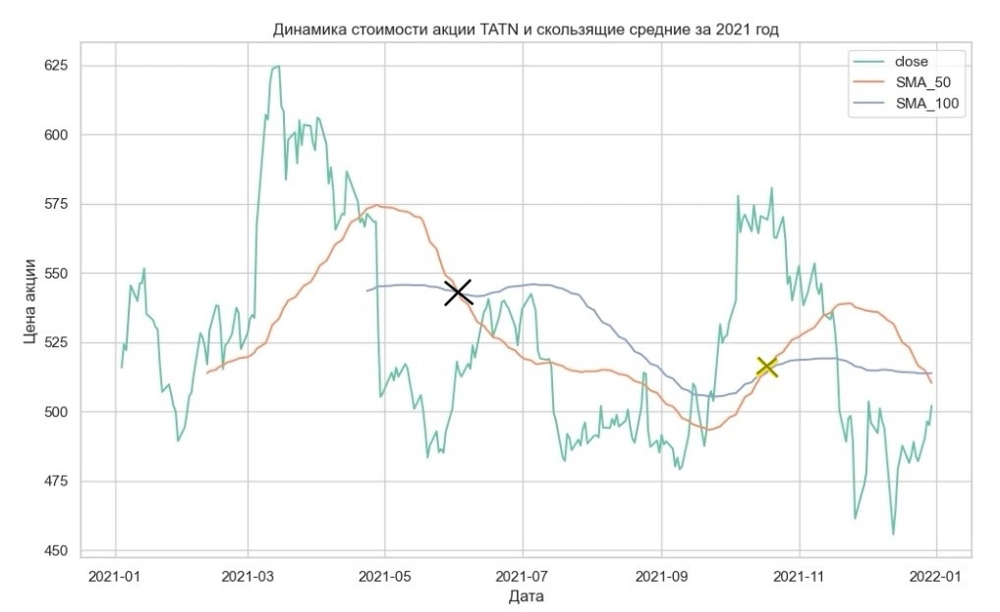

На данном рисунке мы видим целых 3 креста: мертвый, золотой и снова мертвый (не отмечен). То есть в июне 2021 года стоило продать акции Татнефти, а во второй половине октября - купить.


# Задание 9. Добавьте экспоненциальные скользящие средние для каждого тикера с периодом 50

In [31]:
from ta import trend

In [32]:
ema_50 = []
for i in tickers:
    #считаем скользящие средние по кажому отдельному тикеру
    ema_50_ticker = list(trend.ema_indicator(close = data[data['ticker'] == i]['close'], window = 50))
    #объединяем в один список средние для разных тикеров (формируем будующий столбец)
    ema_50 += ema_50_ticker
#добавляем столбец
data['EMA_50'] = ema_50 
data['EMA_50'] = data['EMA_50']

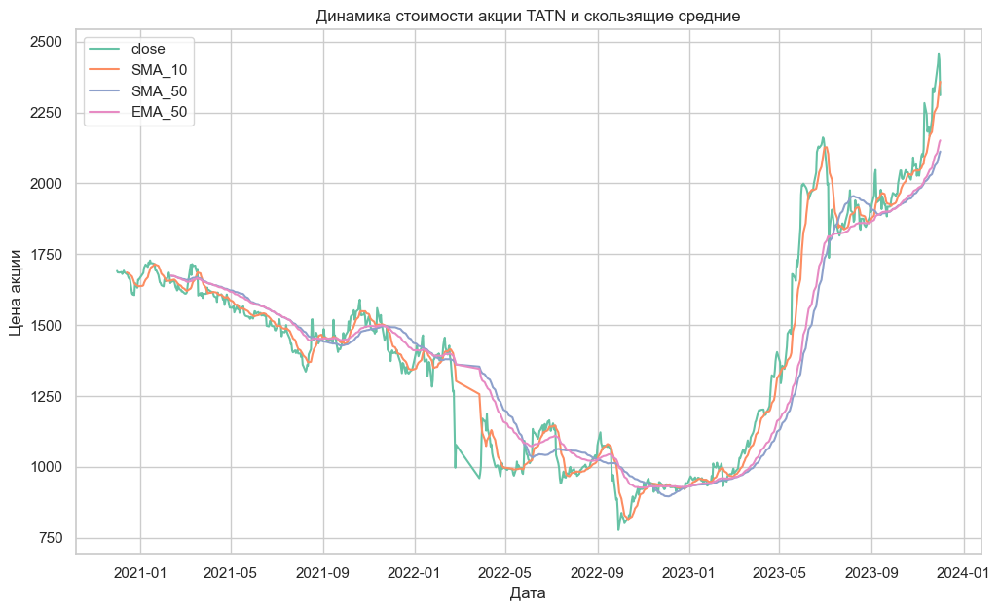

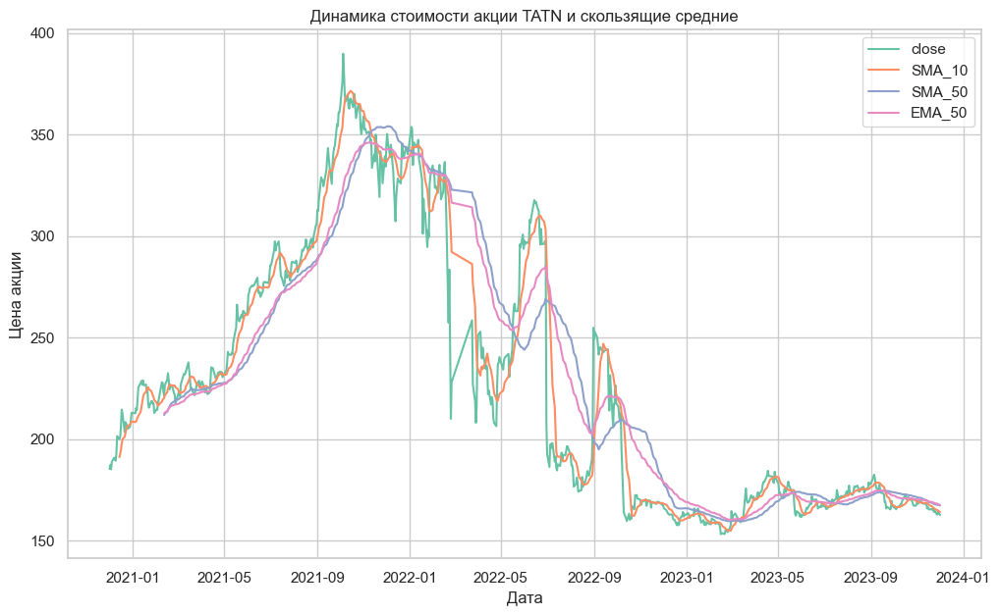

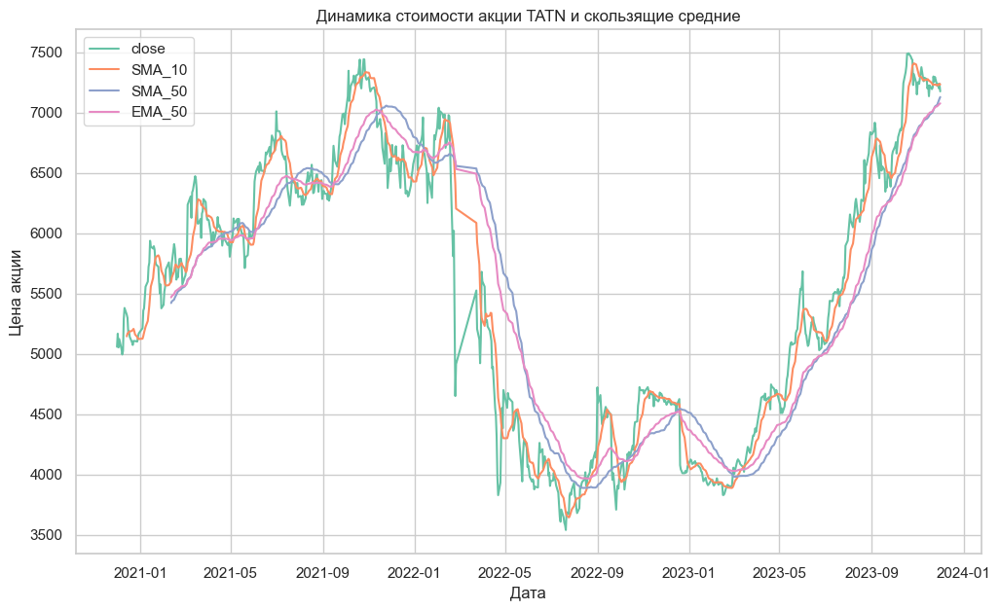

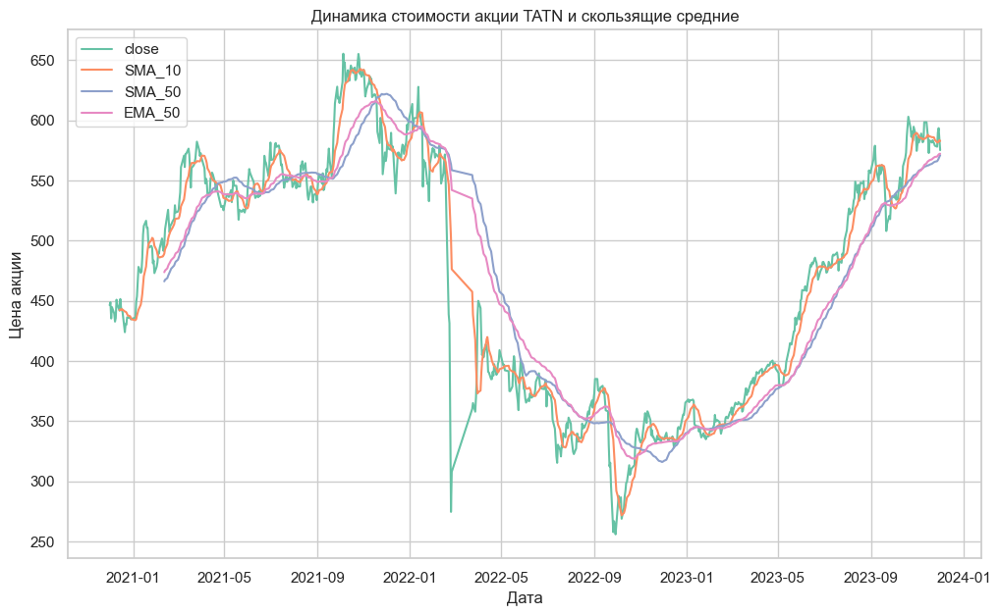

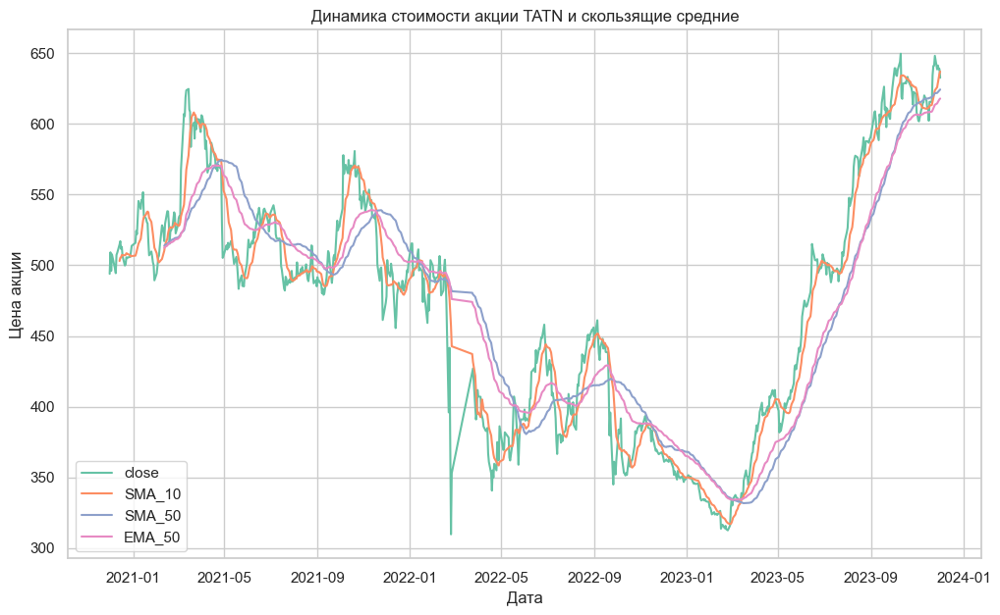

In [33]:
for i in tickers:
    #построение графиков
    sns.lineplot(data=data[data['ticker'] ==i] , x='date', y='close').set(title=f'Динамика стоимости акции {ticker} и скользящие средние',  xlabel='Дата', ylabel='Цена акции')
    sns.lineplot(data=data[data['ticker'] ==i], x='date', y='SMA_10')
    sns.lineplot(data=data[data['ticker'] ==i], x='date', y='SMA_50')
    sns.lineplot(data=data[data['ticker'] ==i], x='date', y='EMA_50')
    plt.legend(['close', 'SMA_10', 'SMA_50', 'EMA_50'])
    plt.show()

Экспоненциальная скользящая средняя напоминает простую скользящую среднюю, однако для неё меньше характерно "запаздывание". Решила рассчитать экспоненциальную для периода в 10 дней.


In [34]:
ema_10 = []
for i in tickers:
    #считаем скользящие средние по кажому отдельному тикеру
    ema_10_ticker = list(trend.ema_indicator(close = data[data['ticker'] == i]['close'], window = 10))
    #объединяем в один список средние для разных тикеров (формируем будующий столбец)
    ema_10 += ema_10_ticker
#добавляем столбец
data['EMA_10'] = ema_10
data['EMA_10'] = data['EMA_10']

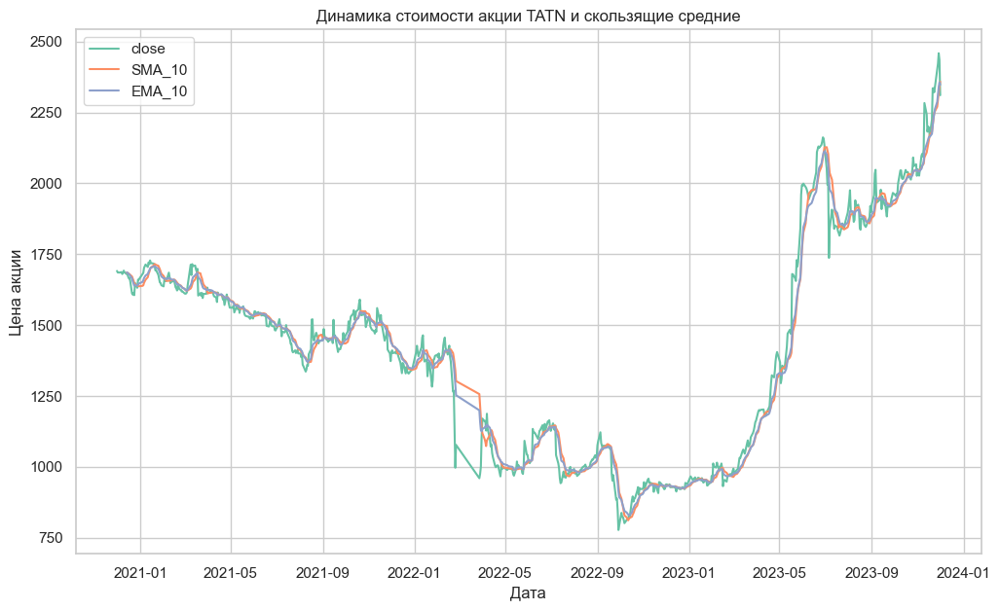

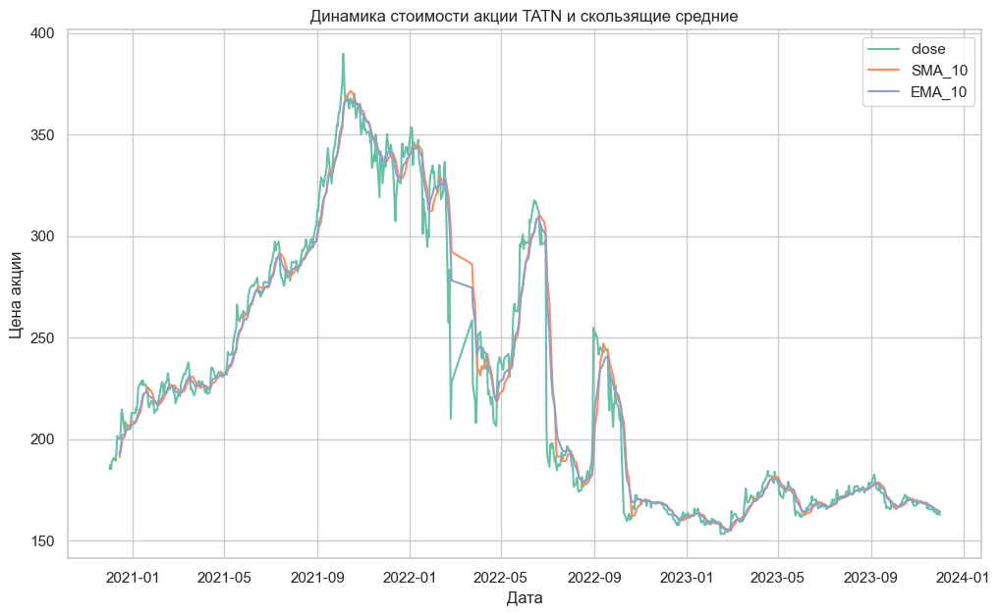

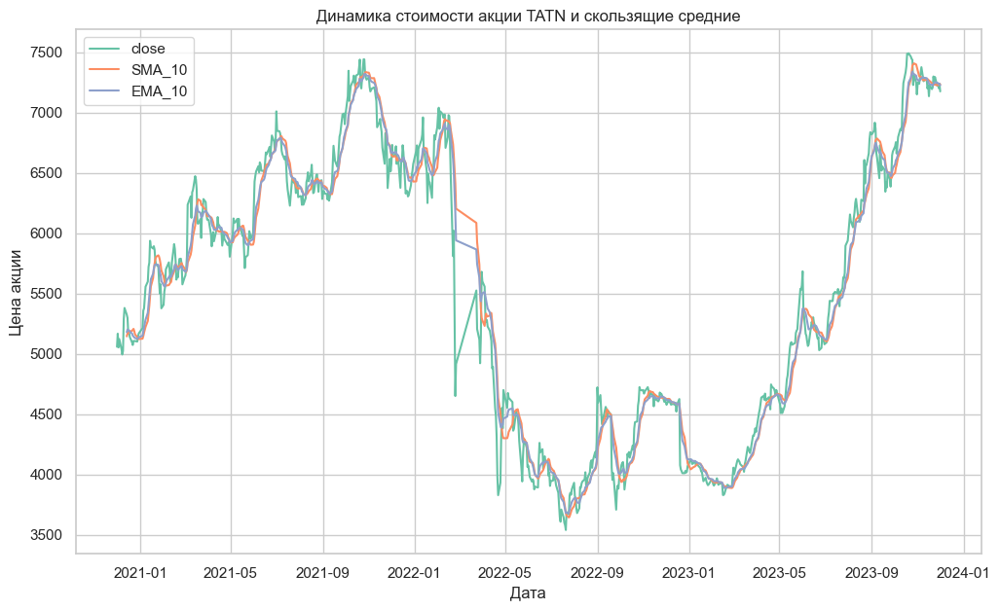

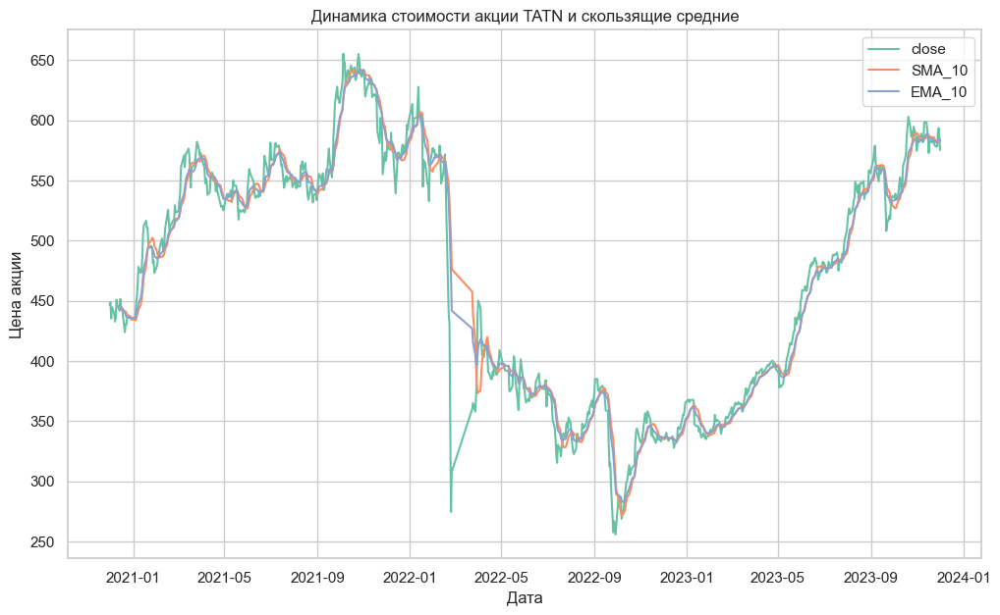

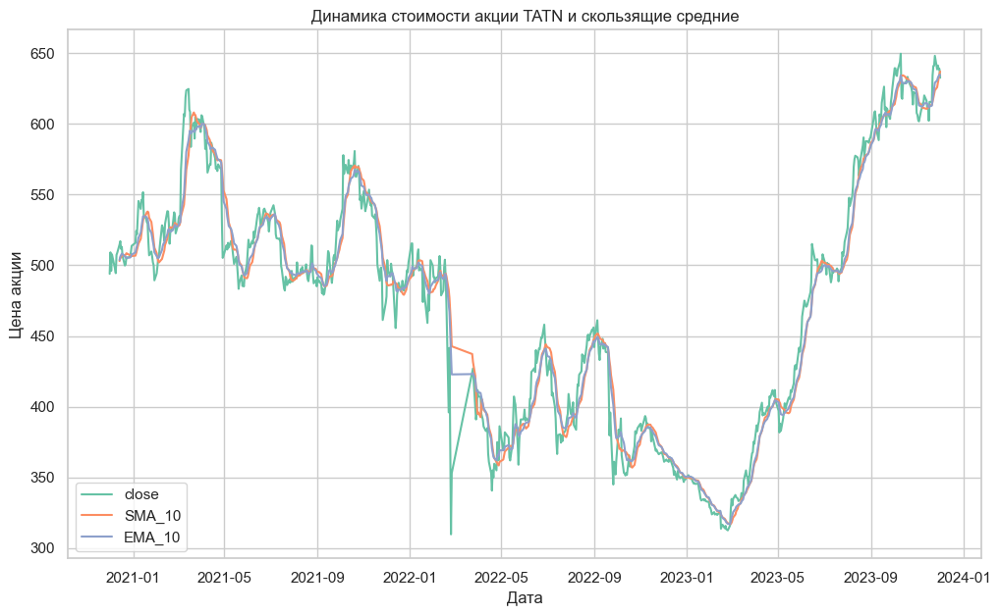

In [35]:
for i in tickers:
    #построение графиков
    sns.lineplot(data=data[data['ticker'] ==i] , x='date', y='close').set(title=f'Динамика стоимости акции {ticker} и скользящие средние',  xlabel='Дата', ylabel='Цена акции')
    sns.lineplot(data=data[data['ticker'] ==i], x='date', y='SMA_10')
    sns.lineplot(data=data[data['ticker'] ==i], x='date', y='EMA_10')
    plt.legend(['close', 'SMA_10', 'EMA_10'])
    plt.show()

Для такого маленького периода различия между двумя скользящими еле уловимы. Падение в феврале лучше отражает EMA_10, а не SMA_10; но на некоторыхдругих участках лучше ведет себя SMA_10

# Задание 10. Осуществите расчет индикатора RSI.

In [36]:
def rsi(data, periods = 14): #считаем по SMA_14, как рекомендованно 
    close_delta = data['close'].diff() #разница между текущейи предыдущей ценой закртия
    up = close_delta.clip(lower=0)
    down = -1 * close_delta.clip(upper=0)
    ma_up = up.rolling(window = periods).mean()
    ma_down = down.rolling(window = periods).mean()     
    rsi = ma_up / ma_down
    rsi = 100 - (100/(1 + rsi))
    return rsi


In [37]:
data['RSI'] = rsi(data)
data

,ticker,per,date,open,high,low,close,vol,year,volatility,volatility_percentage,SMA_10,SMA_50,SMA_100,EMA_50,EMA_10,RSI
0,BANE,D,2020-12-01,1698.0,1707.0,1686.0,1691.0,11327,2020,-7.0,-0.41,NaN,NaN,NaN,NaN,NaN,NaN
1,BANE,D,2020-12-02,1703.0,1707.0,1648.0,1685.5,15541,2020,-17.5,-1.03,NaN,NaN,NaN,NaN,NaN,NaN
2,BANE,D,2020-12-03,1692.5,1695.5,1678.0,1685.5,4745,2020,-7.0,-0.41,NaN,NaN,NaN,NaN,NaN,NaN
3,BANE,D,2020-12-04,1690.0,1706.5,1685.0,1685.0,5277,2020,-5.0,-0.30,NaN,NaN,NaN,NaN,NaN,NaN
4,BANE,D,2020-12-07,1685.0,1707.0,1657.5,1687.0,4132,2020,2.0,0.12,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3718,TATN,D,2023-11-27,649.1,649.9,636.4,638.4,2292875,2023,-10.7,-1.65,625.80,621.774,589.666,614.379181,630.664120,66.075650
3719,TATN,D,2023-11-28,638.2,643.7,632.3,641.2,1482882,2023,3.0,0.47,628.85,622.396,591.171,615.430978,632.579734,65.873960
3720,TATN,D,2023-11-29,641.9,644.2,636.6,638.7,932561,2023,-3.2,-0.50,631.54,622.934,592.602,616.343488,633.692510,63.678696
3721,TATN,D,2023-11-30,639.0,644.0,635.0,638.8,1170553,2023,-0.2,-0.03,635.21,623.758,594.043,617.224136,634.621144,61.576355


# Задание 11. Создайте функцию для вывода графиков: цены, скользящей средней (тип и период определите самостоятельно) и отдельный график для RSI индикатора. На графике с RSI добавьте две красные линии на уровнях 70 и 30. На вход функция принимает два параметра: тикер и год.

In [38]:
def plot_function_2(tickers, years):
    for ticker in tickers: 
        for year in years:
            data_ticker = data[(data['ticker'] == ticker) & (data['year'] == year)]
            sns.lineplot(data=data_ticker, x='date', y='close').set(title=f'Динамика стоимости акции {ticker} и скользящие средние за {year} год',  xlabel='Дата', ylabel='Цена акции')
            sns.lineplot(data=data_ticker, x='date', y='EMA_10')
            sns.lineplot(data=data_ticker, x='date', y='SMA_10')
            plt.legend(['close', 'EMA_10', 'SMA_10'])
            plt.show()
            sns.lineplot(data=data_ticker, x='date', y='RSI').set(title=f'Значение индикатора RSI для акции {ticker} за {year} год',  xlabel='Дата', ylabel='Значение показателя')
            plt.legend(['RSI'])
            plt.axhline(y=30, color='red')
            plt.axhline(y=70, color='red')
            plt.axhline(y=50, color='green')
            plt.show()

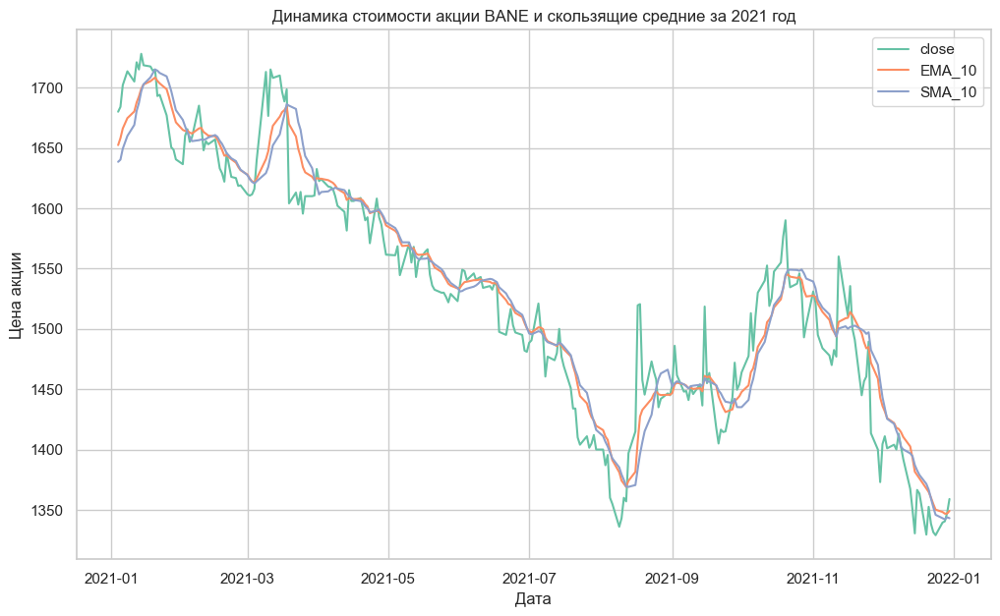

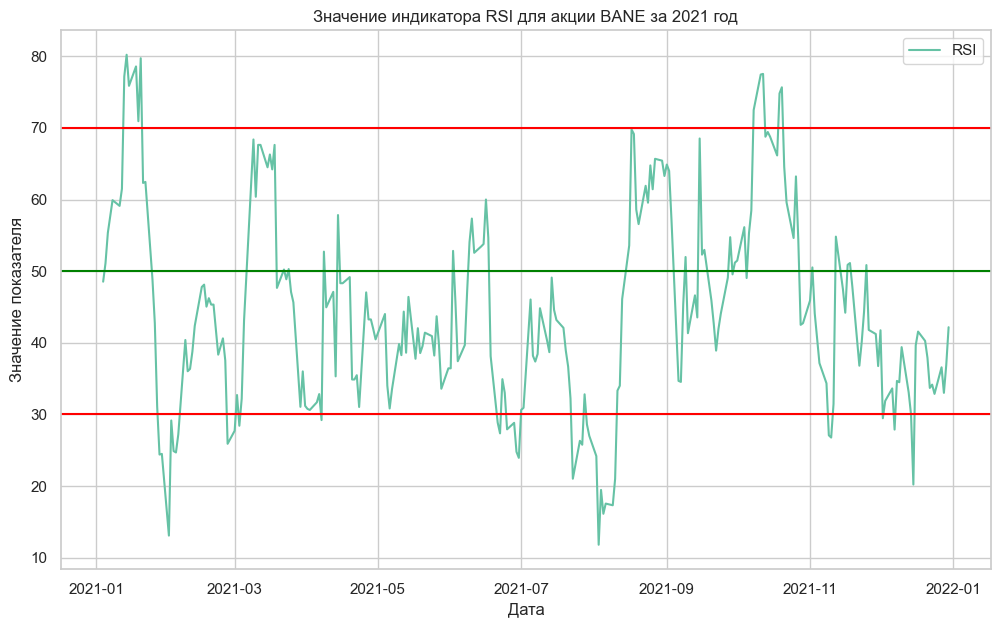

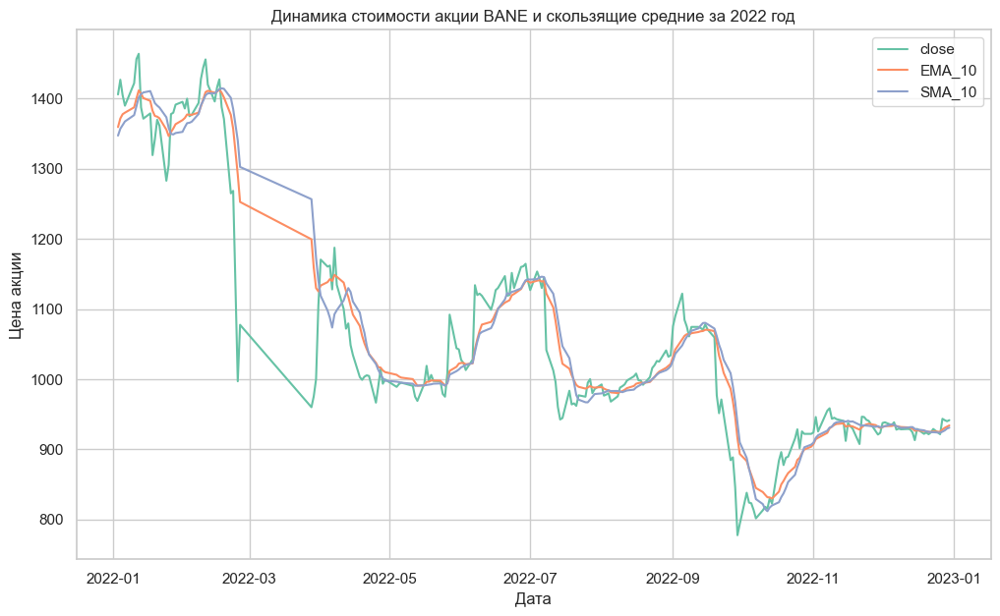

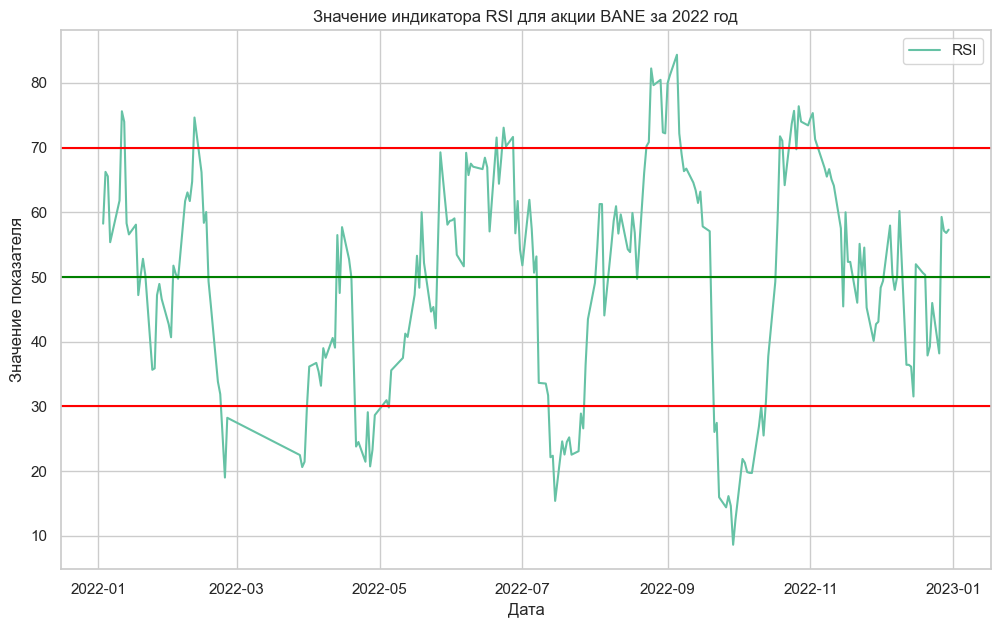

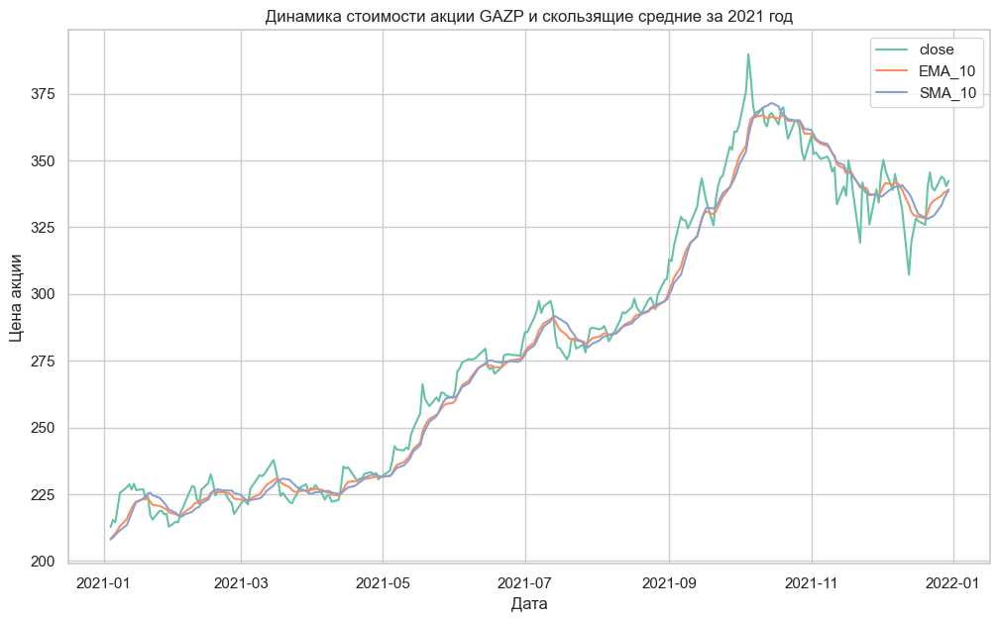

...

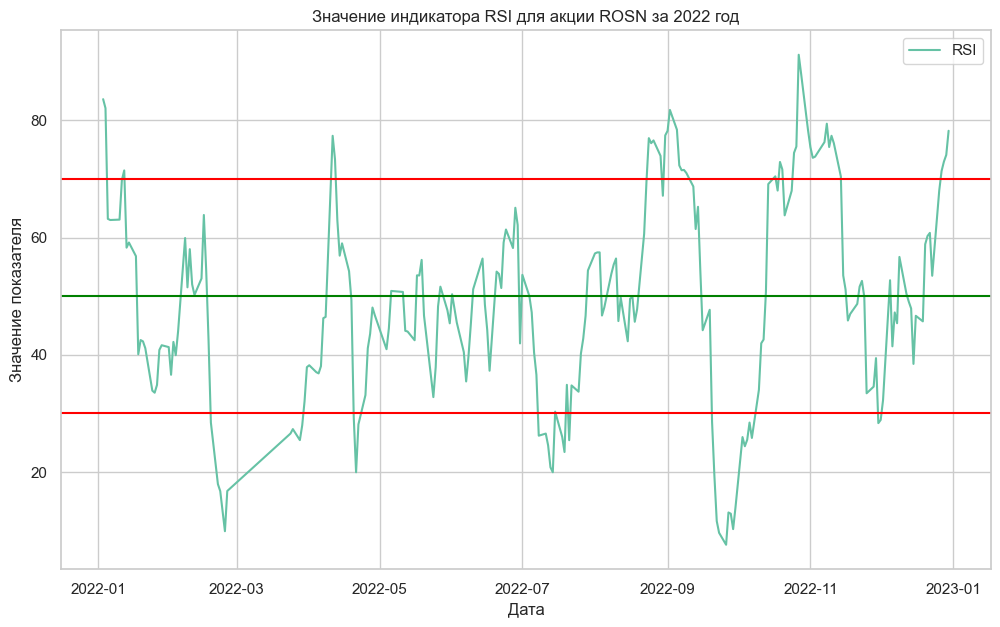

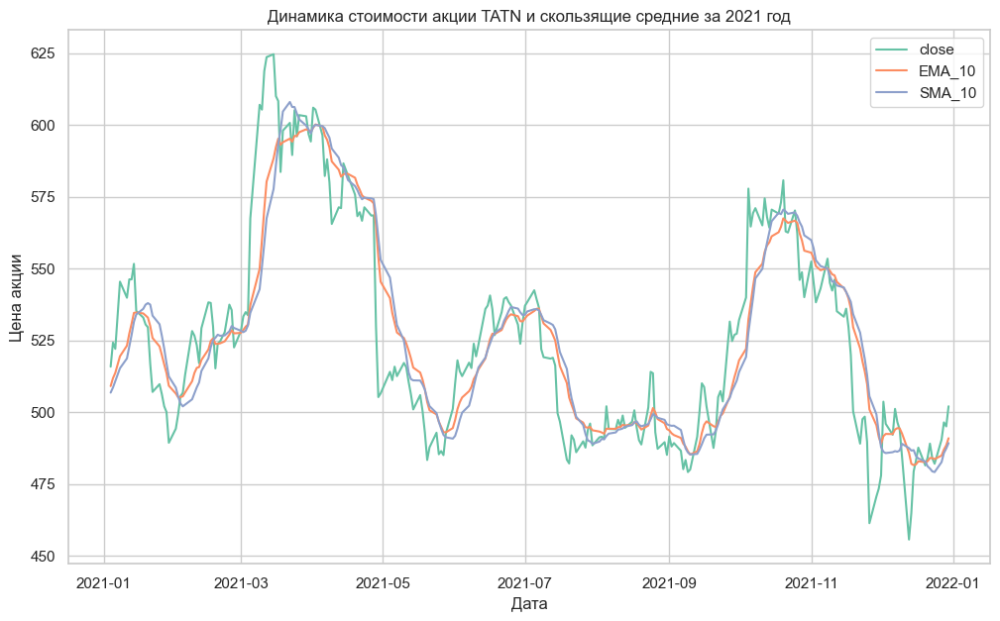

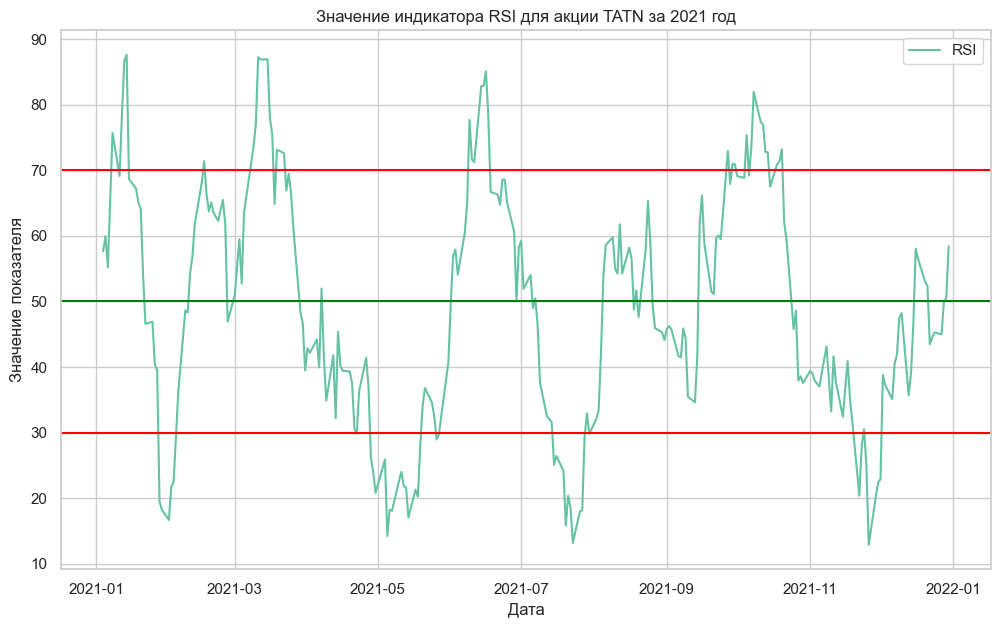

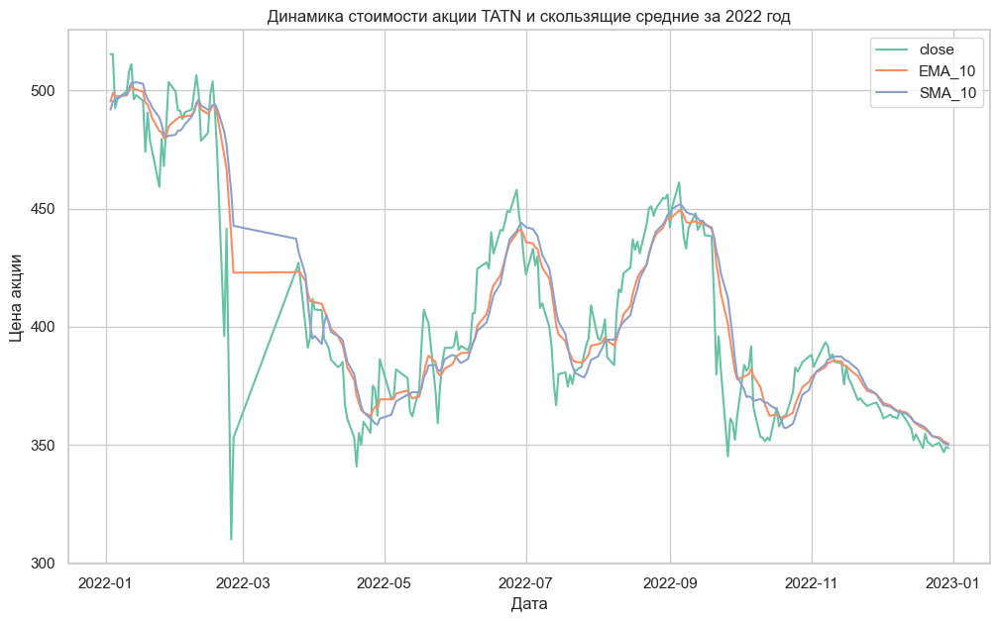

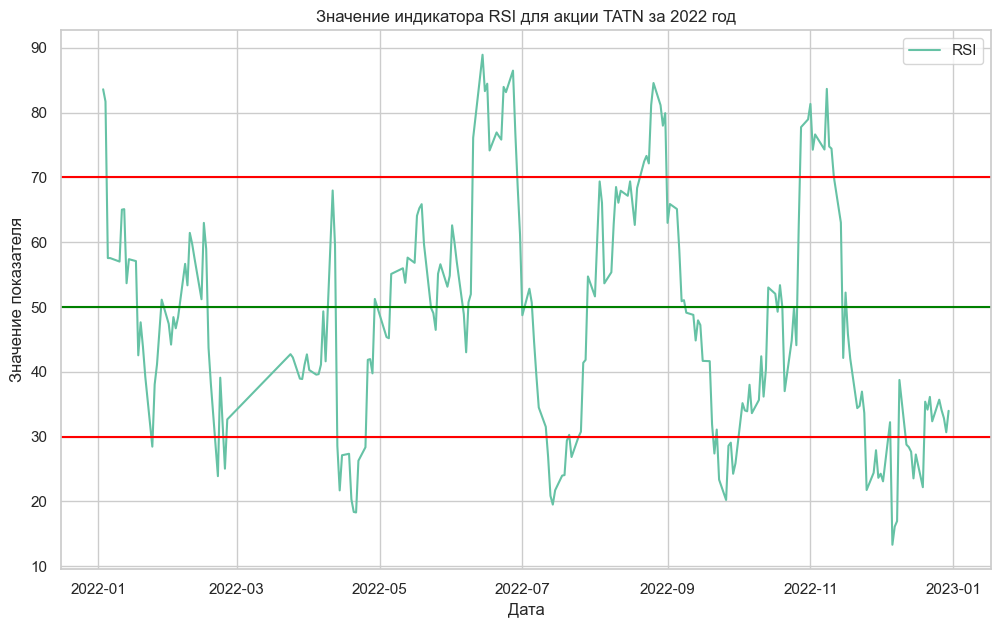

In [39]:
years_11 = ['2021', '2022'] #не буду запускать, чтобы не перегружать графиками
plot_function_2(tickers, years_11)

Линия роста на графике динамики цены, соединяющая два максимума, и линия снижения RSI показаны нас ледующий двух графиках ярко-голубым цветом. Данная ситуация немного напоминает дивергенцию, но, на мой взгляд, максимумы выражены недостаточно ярко.

В примере из рекомендованной статьи рассмотрены данные за несколько часов, а мы рассматриваем по дням. Возможно для поиска "фигур" нужно изучить данные за небольшой промеужток времени.



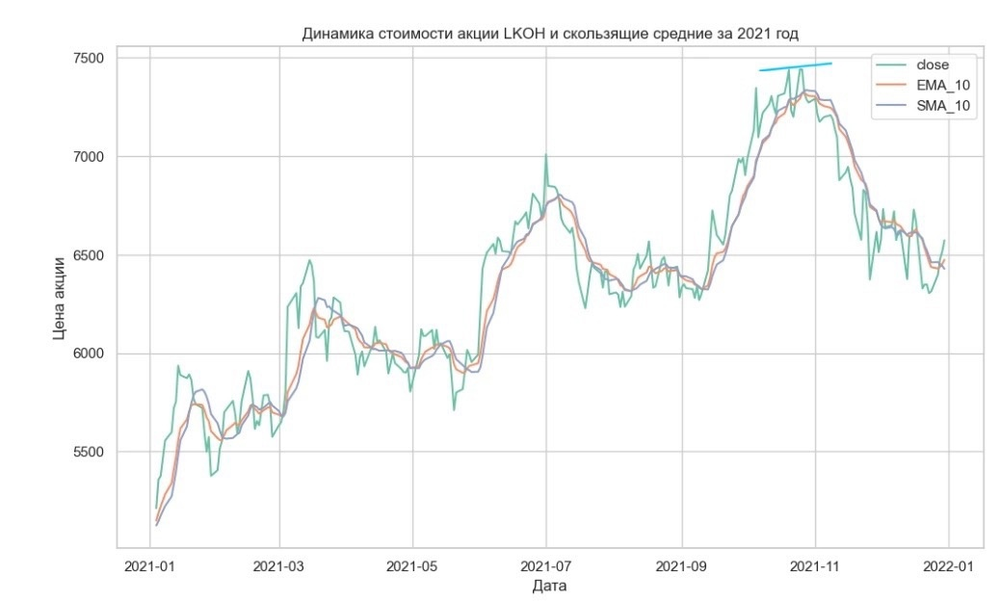
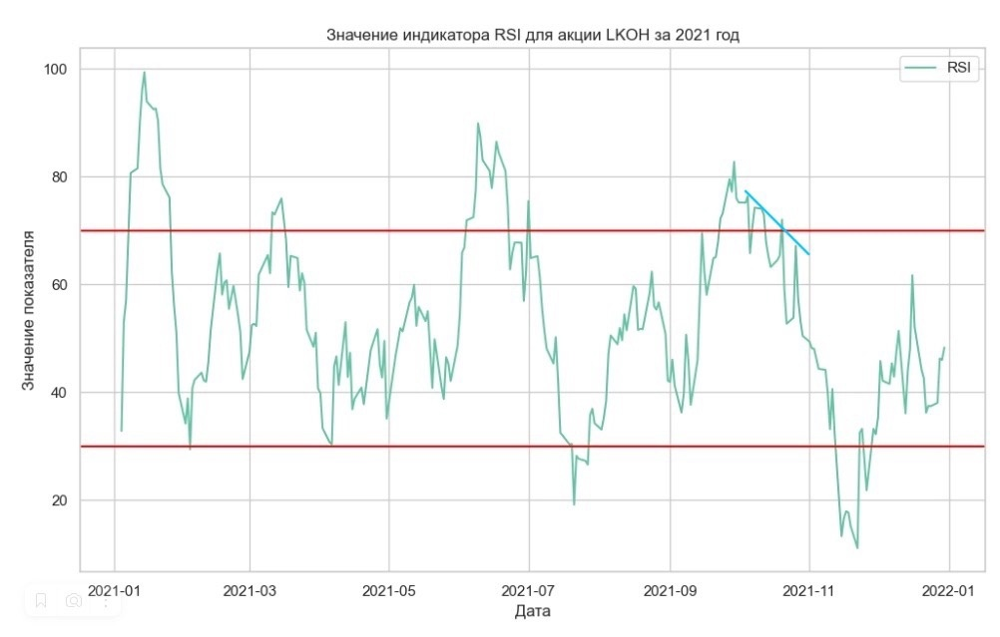

Также можно отслеживать на индикаторе зоны перекупленности и перепроданности, в которых в качестве сигналов можно использовать развороты индикатора и его выход из зоны. Чаще всего применение находят уровни 70% и 30% или 80% и 20%. 
Например, в октябре 2021 года показатель RSI для акции Лукойл был болешь отметки в 70%. Значит, актив был перекуплен и входить в покупки было неблагоразумно.
В ноябре-декабре 2021 года - обратная ситуация. RSI ниже 30, то есть актив был перепродан, можно входить в покупки.




Еще один дополнительный сигнал от индикатора RSI - определение направления текущей тенденции. Принято считать, что если значение индикатора пересекает отметку в 50 - то тренд меняется. В конце февраля 2021 года RSI для компании Лукойл пересек данную отметку (красная точка). На графике линамики цены падение сменилось ростом. То же самое было, например, в начале февраля.

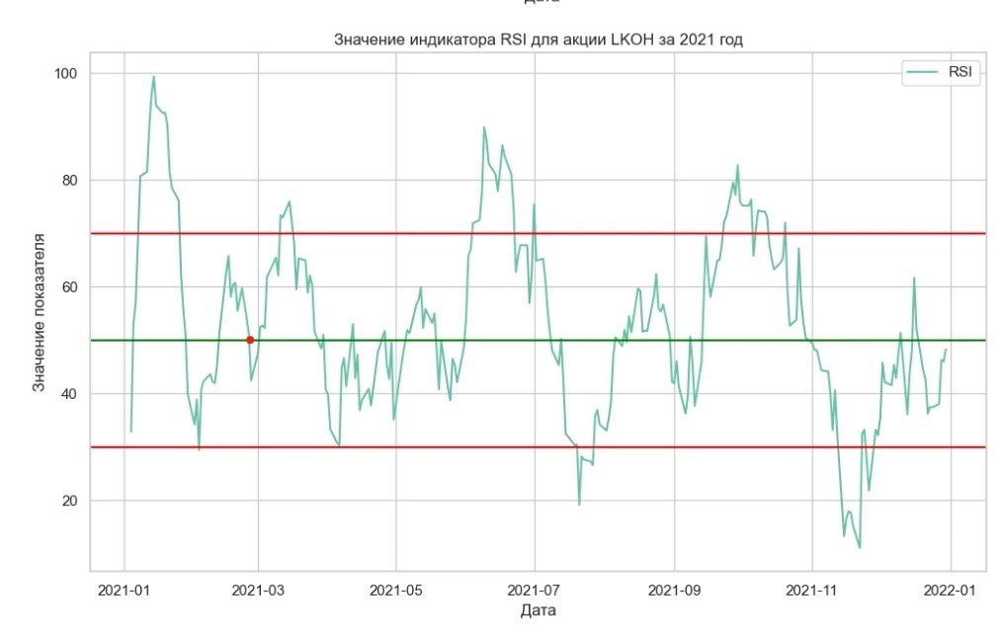
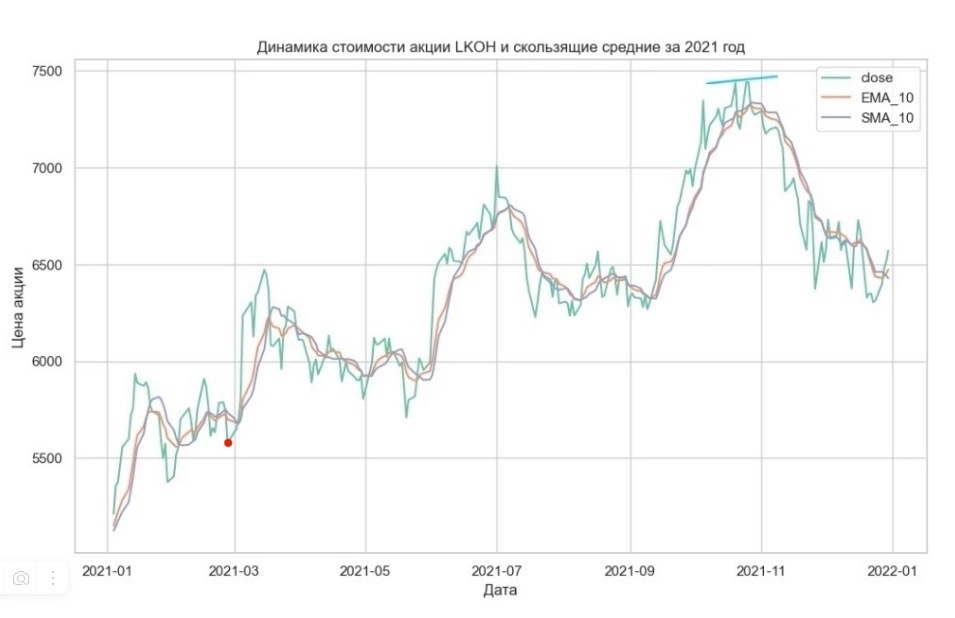

# Дополнительная задача. Постройте модель прогноза цены акции

In [40]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.linear_model import LassoCV, RidgeCV
from scipy.stats import linregress
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from scipy import stats as st
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, median_absolute_error, mean_absolute_percentage_error
import statsmodels.api as sm


In [41]:
df = data.query('(ticker == "ROSN") and (year == "2022")') #рассмотрим один тикер

In [42]:
df.corr(method='kendall')

,open,high,low,close,vol,volatility,volatility_percentage,SMA_10,SMA_50,SMA_100,EMA_50,EMA_10,RSI
open,1.000000,0.918283,0.897004,0.865014,0.053236,-0.125514,-0.128754,0.754563,0.610446,0.591686,0.661763,0.807712,0.095394
high,0.918283,1.000000,0.882580,0.910276,0.093646,-0.057278,-0.060367,0.759862,0.638178,0.615012,0.684586,0.817496,0.092731
low,0.897004,0.882580,1.000000,0.918285,0.004770,-0.038623,-0.042151,0.709904,0.580010,0.557360,0.631772,0.768488,0.131472
close,0.865014,0.910276,0.918285,1.000000,0.050645,0.010135,0.006904,0.720016,0.603017,0.583518,0.648990,0.778832,0.127753
vol,0.053236,0.093646,0.004770,0.050645,1.000000,0.036520,0.035275,0.099338,0.106161,0.139503,0.086681,0.097832,-0.054144
volatility,-0.125514,-0.057278,-0.038623,0.010135,0.036520,1.000000,0.950894,-0.089633,-0.046321,-0.054505,-0.068673,-0.070655,0.124722
volatility_percentage,-0.128754,-0.060367,-0.042151,0.006904,0.035275,0.950894,1.000000,-0.092429,-0.050362,-0.058547,-0.073083,-0.074037,0.119299
SMA_10,0.754563,0.759862,0.709904,0.720016,0.099338,-0.089633,-0.092429,1.000000,0.693140,0.674236,0.772987,0.914657,-0.023734
SMA_50,0.610446,0.638178,0.580010,0.603017,0.106161,-0.046321,-0.050362,0.693140,1.000000,0.912896,0.891913,0.720750,-0.141856
SMA_100,0.591686,0.615012,0.557360,0.583518,0.139503,-0.054505,-0.058547,0.674236,0.912896,1.000000,0.826419,0.698470,-0.138295


In [43]:
x = df[['open', 'high', 'low', 'vol', 'volatility', 'RSI']]
y = df['close']

In [44]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=13) 
scaler = StandardScaler()
x_train_st = scaler.fit_transform(x_train)
x_test_st = scaler.transform(x_test)

In [45]:
model = Lasso() #Лассо при мультиколлинеарности

In [46]:
model.fit(x_train_st, y_train)
predictions = model.predict(x_test_st)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.080e+02, tolerance: 1.484e+02



In [47]:
r2_score(y_test,predictions)

0.9979111917034283

C:\Users\Виктория\AppData\Local\Temp\ipykernel_15832\3992461598.py:39: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.



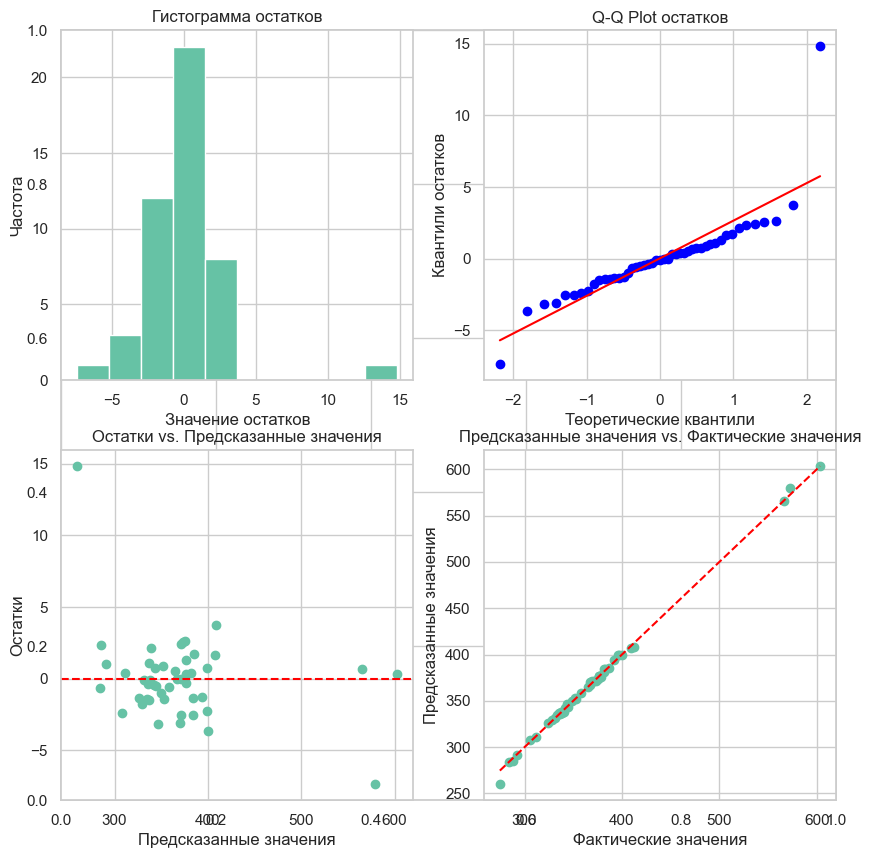

In [48]:
import statsmodels.api as sm

# Получение остатков модели
residuals = y_test - predictions

# Расчет стандартизированных остатков
stand_residuals = (residuals - np.mean(residuals)) / np.std(residuals)
plt.subplots(figsize=(10, 10))


# Распределение остатков
plt.subplot(2, 2, 1)
plt.hist(residuals)
plt.xlabel('Значение остатков')
plt.ylabel('Частота')
plt.title('Гистограмма остатков')
plt.grid(True)


# График остатков vs. предсказанных значений
plt.subplot(2, 2, 2)
st.probplot(residuals, dist='norm', plot=plt)
plt.xlabel('Теоретические квантили')
plt.ylabel('Квантили остатков')
plt.title('Q-Q Plot остатков')
plt.grid(True)

#График остатков относительно прогноза
plt.subplot(2, 2, 3)
plt.scatter(predictions, residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Предсказанные значения')
plt.ylabel('Остатки')
plt.title('Остатки vs. Предсказанные значения')

# Предсказанные и фактические значения
plt.subplot(2, 2, 4)
plt.scatter(y_test, predictions)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()],  "k--", color='r')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказанные значения')
plt.title('Предсказанные значения vs. Фактические значения')
plt.show()

In [49]:
mse = mean_squared_error(y_test, predictions)
rmse = mean_squared_error(y_test, predictions, squared=False)
mae = mean_absolute_error(y_test, predictions)
mape = mean_absolute_percentage_error(y_test, predictions)

print("Среднеквадратическая ошибка (MSE):", mse)
print("Среднеквадратическая ошибка (RMSE):", rmse)
print("Средняя абсолютная ошибка (MAE):", mae)
print("Средняя абсолютная ошибка  (MAPE):", mape)

Среднеквадратическая ошибка (MSE): 8.60527042328137
Среднеквадратическая ошибка (RMSE): 2.93347412180189
Средняя абсолютная ошибка (MAE): 1.7851402951379867
Средняя абсолютная ошибка  (MAPE): 0.0050641984027546905


Соотношение предсказанных и фактических значений хорошее, но наблюдается гетероскедастичность остатков.


SARIMA-модель. <br>
У меня не получилось довести её до конца, но код жалко. Пусть останется на следующий семестр, когда мы будем проходить анализ временных рядов.

In [50]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
import itertools
import warnings

In [51]:
#строим модель по одному тикеру
df = data.query('(ticker == "ROSN") and (year == "2022")')
df = df[['date','close']]
df

,date,close
2510,2022-01-03,610.95
2511,2022-01-04,613.50
2512,2022-01-05,590.30
2513,2022-01-06,601.60
2514,2022-01-10,602.00
...,...,...
2739,2022-12-26,352.40
2740,2022-12-27,355.45
2741,2022-12-28,355.10
2742,2022-12-29,359.60


In [52]:
# ADF-тест (на стационарность)
ad_fuller_result = adfuller(df['close'])
print(f'ADF Statistic: {ad_fuller_result[0]}')
print(f'p-value: {ad_fuller_result[1]}')

ADF Statistic: -2.604905755861825
p-value: 0.09198758053048534


Ряд не стационарен, так как p-value больше 0,05.

In [53]:
#строим стационарный ряд
df['close_diff'] = df['close'] - df['close'].shift(1)
df.dropna(subset = ['close_diff'], inplace=True)
df

,date,close,close_diff
2511,2022-01-04,613.50,2.55
2512,2022-01-05,590.30,-23.20
2513,2022-01-06,601.60,11.30
2514,2022-01-10,602.00,0.40
2515,2022-01-11,613.60,11.60
...,...,...,...
2739,2022-12-26,352.40,9.10
2740,2022-12-27,355.45,3.05
2741,2022-12-28,355.10,-0.35
2742,2022-12-29,359.60,4.50


In [54]:
# ADF-тест (на стационарность)
ad_fuller_result = adfuller(df['close_diff'])
print(f'ADF Statistic: {ad_fuller_result[0]}')
print(f'p-value: {ad_fuller_result[1]}')

ADF Statistic: -9.441710957173747
p-value: 4.874858461436352e-16


Ряд стационарен, так как p-value меньше 0,05.

<Axes: >

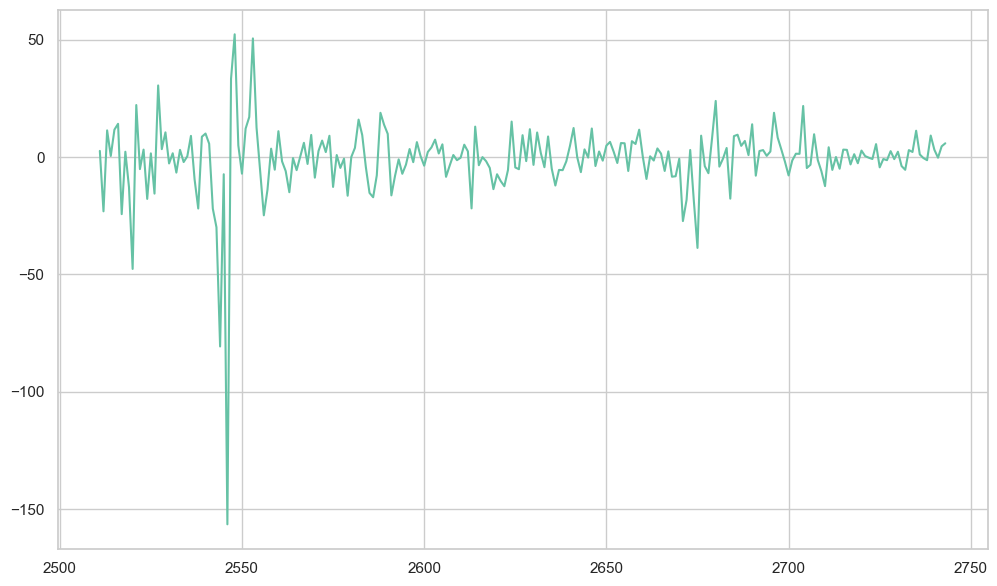

In [55]:
df['close_diff'].plot()

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



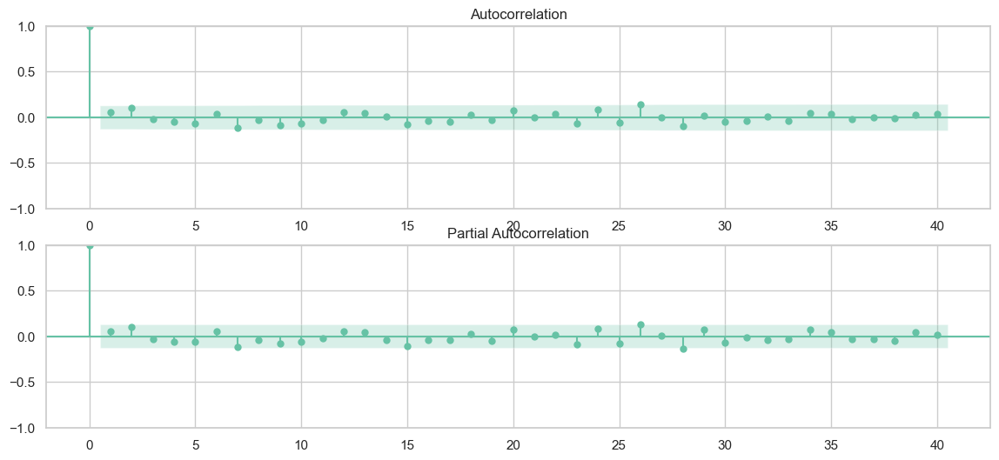

In [56]:
#графики автокорреляции и частичной автокорреляции
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
import statsmodels.api as sm
fig = plt.figure(figsize=(14,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df['close_diff'].dropna(),lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df['close_diff'].dropna(),lags=40,ax=ax2)

In [57]:
#модель
best_model = SARIMAX(df['close_diff'], order=(2, 1, 2), seasonal_order=(2, 1, 2, 12)).fit(dis=-1) 
print(best_model.summary())

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\optimizer.py:17: FutureWarning:

Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: dis. After release 0.14, this will raise.



                                     SARIMAX Results                                      
Dep. Variable:                         close_diff   No. Observations:                  233
Model:             SARIMAX(2, 1, 2)x(2, 1, 2, 12)   Log Likelihood                -939.600
Date:                            Sat, 23 Dec 2023   AIC                           1897.201
Time:                                    23:21:16   BIC                           1927.744
Sample:                                         0   HQIC                          1909.535
                                            - 233                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8650      0.074    -11.655      0.000      -1.010      -0.719
ar.L2          0.1136      0.046   

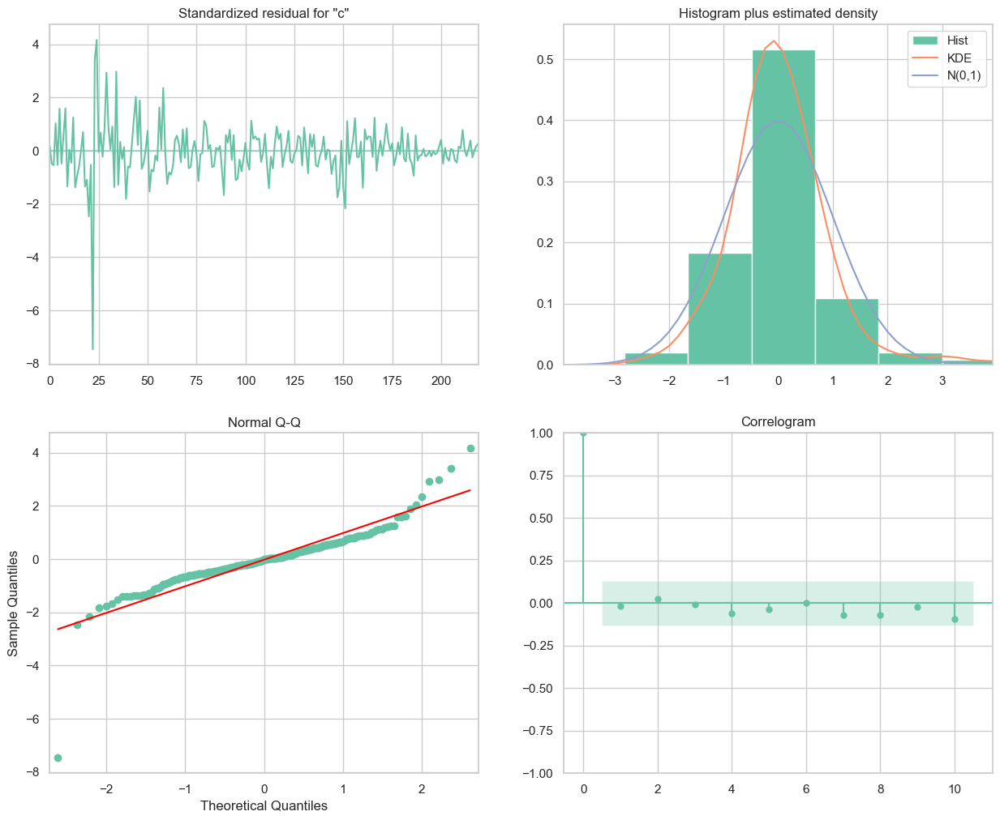

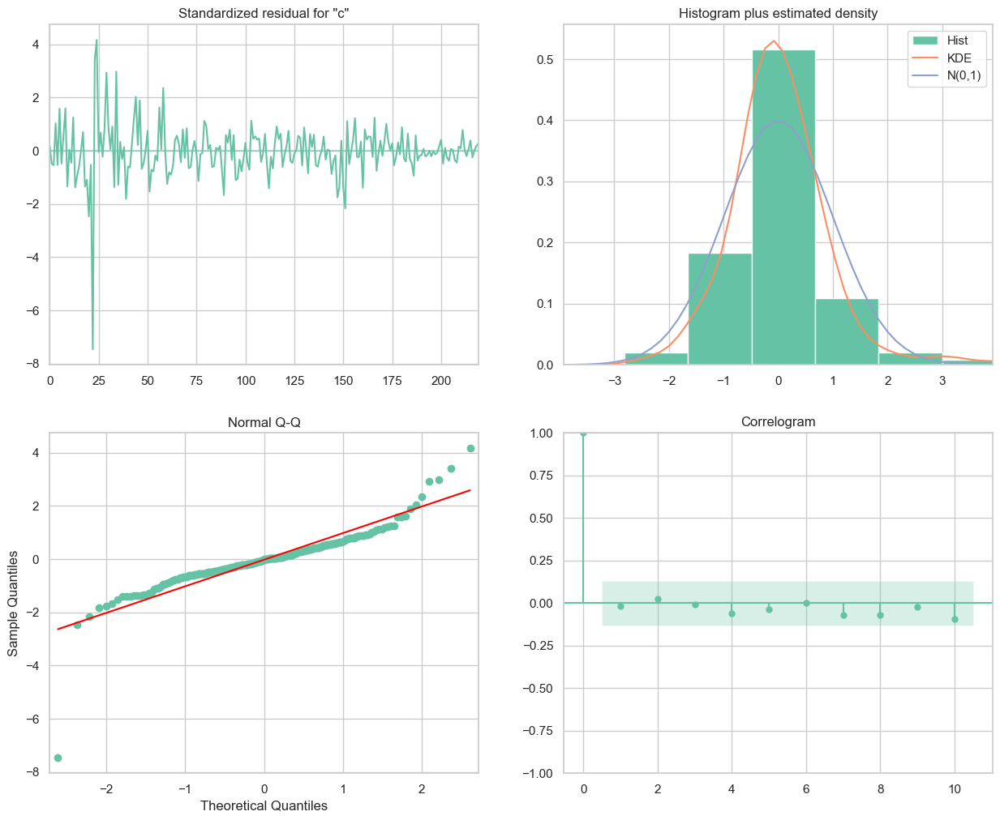

In [58]:
#график остатков, Q-Q plot
best_model.plot_diagnostics(figsize=(15,12))

In [59]:
#прогноз
forecast_values = best_model.predict()
forecast_values

2511     0.000000
2512     2.549488
2513   -23.189699
2514    11.286808
2515     0.404019
          ...    
2739     2.727075
2740     7.258304
2741    -0.634755
2742     1.531125
2743     1.391309
Name: predicted_mean, Length: 233, dtype: float64

In [60]:
df_new= pd.DataFrame()
df_new['forecast_values'] = forecast_values + df['close']
df_new['date'] = df['date']
df_new

,forecast_values,date
2511,613.500000,2022-01-04
2512,592.849488,2022-01-05
2513,578.410301,2022-01-06
2514,613.286808,2022-01-10
2515,614.004019,2022-01-11
...,...,...
2739,355.127075,2022-12-26
2740,362.708304,2022-12-27
2741,354.465245,2022-12-28
2742,361.131125,2022-12-29


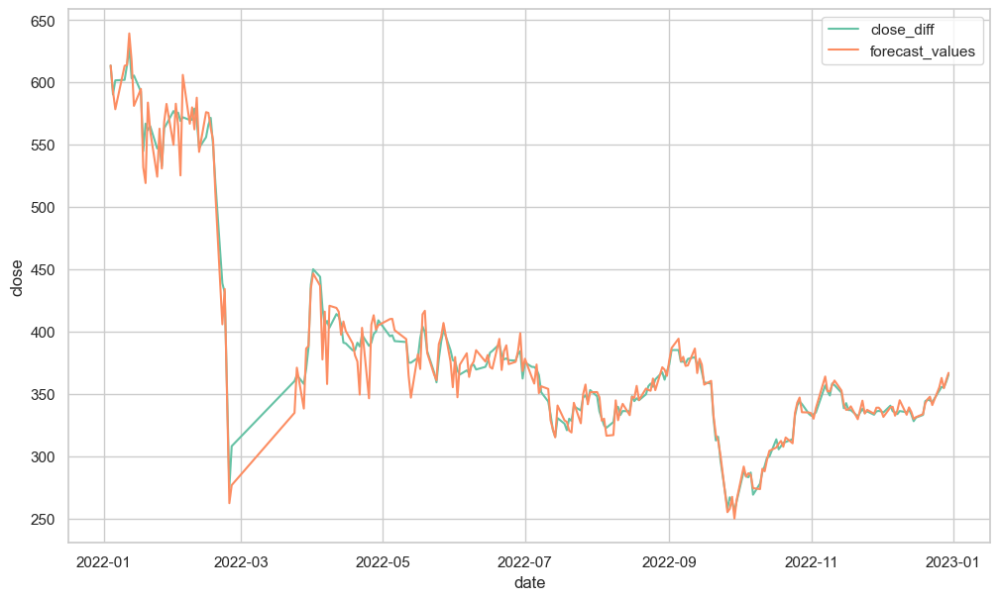

In [61]:
sns.lineplot(data=df, x='date', y='close')
sns.lineplot(data=df_new, x='date', y='forecast_values')
plt.legend(['close_diff', 'forecast_values'])
plt.show()


In [62]:
train = df[:int(0.85*(len(df)))]
test = df[int(0.85*(len(df))):]
start=len(train)
end=len(train)+len(test)-1
predictions = best_model.predict(start=start, end=end, dynamic=False, typ='levels').rename('SARIMA Predictions')
evaluation_results = pd.DataFrame({'r2_score': r2_score(test['close_diff'], predictions)}, index=[0])
evaluation_results['mean_absolute_error'] = mean_absolute_error(test['close_diff'], predictions)
evaluation_results['mean_squared_error'] = mean_squared_error(test['close_diff'], predictions)
evaluation_results['root_mean_squared_error'] = np.sqrt(mean_squared_error(test['close_diff'], predictions))
evaluation_results['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - test['close_diff'])/np.abs(test['close_diff']))*100 
evaluation_results

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
0,-0.457886,4.113598,29.372551,5.419645,327.663491
